# Fuzzy Calibration — 标注 + 可视化 + 拟合

**所有标注在这一个文件里维护**（合并了原 `D_S3_visual_noise`）。

流程严格从 Step 1 向后级联。每一行 replicate 都是一个独立 case；family × SNR 只共享人工标签，不先取均值或分位数。

每一步固定保留两张主图：
1. **Figure A — labeled scatter grid**：用 representative replicate 展示人工标签；
2. **Figure B — fuzzy calibration**：全部 replicate 各自作为一个点，叠加 $[L,U]$ membership curve。

**决策树 Simple 路径（每步基于上一步的 Yes 分支）**：

| Step | Gate | Indicator | Hard threshold | 参与 family | Human question |
|---|---|---|---|---|---|
| 1 | Global | MIC | MIC ≥ 0.8 | 全部 F01–F26 + Null | 有没有 global relationship？ |
| 2 | Simple/Complex | \|ρ\|, \|r\|, signal change | \|ρ\|≥0.7, \|r\|≥0.7, sc≤1 | 通过 Step 1 的 | 看起来像 simple 还是 complex？ |
| 3 | Monotonicity | \|ρ\| | \|ρ\| ≥ 0.9 | 通过 Step 2 Simple 的 (F01–F14) | 单调性是否足够强？ |
| 4 | Linearity | \|r\|, $\Delta BIC$ | \|r\| ≥ 0.9, $\Delta BIC<6$ | 通过 Step 3 的 | 看起来像不像直线？ |
| 5 | Curvature | derivative pattern | f′ / f″ sign pattern | Step 4 Non-line 分支 | 凹、凸还是 S 形？ |

Complex 路径（并行检测）: Branching / Threshold / Turning-point → 各自的子分类

**Family 分组**：
- Simple: F01–F14（含 S-curve，单调）
- Complex: F15–F18, F21–F26（含 Threshold，不连续/非单调）
- 排除: F19/F20 (Spike, 非 global)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import warnings, os

os.environ.setdefault('MPLCONFIGDIR', str(Path('.matplotlib').resolve()))
warnings.filterwarnings('ignore')

S1_DIR = Path('output/S1')
S2_DIR = Path('output/S2')
OUT_DIR = Path('output/S3_polyfit')
OUT_DIR.mkdir(parents=True, exist_ok=True)

cases = pd.read_csv(S1_DIR / 'cases.csv', low_memory=False)
metrics = pd.read_parquet(S2_DIR / 'metrics_full.parquet')
cases['snr_float'] = cases['snr'].apply(lambda x: float(x))

# scatter points for visual grid
pts = np.load(S1_DIR / 'scatter_points.npz')
x_all, y_all = pts['x'], pts['y']
case_idx_map = pd.Series(np.arange(len(cases)), index=cases['case_id']).to_dict()

df = cases.merge(
    metrics[['case_id', 'MIC', 'distance_correlation', 'pearson_r', 'spearman_rho']],
    on='case_id', how='inner',
)

# STRONG variant (matching visual annotations)
strong = df[df['variant_level'] == 'mild'].copy()
null = df[df['family_id'] == 'Null'].copy()
strong = pd.concat([strong, null], ignore_index=True)

# strong-variant cases for visual grid
all_cases = cases[cases['variant_level'] == 'strong'].copy()
null_cases = cases[(cases['family_id'] == 'Null') & (cases['variant_level'] == 'none')]
all_cases = pd.concat([all_cases, null_cases], ignore_index=True)

FAMILIES = [f'F{i:02d}' for i in range(1, 27)]
ALL_FIDS = sorted(cases['family_id'].unique())

SHORT = {}
for fid in ALL_FIDS:
    row = cases[cases['family_id'] == fid].iloc[0]
    SHORT[fid] = str(row['family_name'])

print(f'Total merged: {len(df):,} rows')
print(f'Strong variant + Null: {len(strong):,} rows')
print(f'Families: {len(FAMILIES)}')

FileNotFoundError: [Errno 2] No such file or directory: 'output/S1/cases.csv'

## 人工标注 — CLEAR / THRESHOLD SNR

**唯一标注源**，改这里就行，不用改别的文件。

- **CLEAR_SNR**: SNR ≥ 这个值 → relationship 清晰可见 (label = 1)
- **THRESHOLD_SNR**: SNR ≤ 这个值 → 看不出来 (label = 0)
- 中间 = 不确定 (label = 0.5)

特殊：
- **F19/F20 (Spike)**: 不是 global relationship → Step 1 永远 label=0（但仍有标注，用于可视化）
- **Null**: 无 relationship → 永远 label=0

In [2]:
# ══════════════════════════════════════════════════════
#  唯一标注源 — 修改这里后重新运行 notebook 即可
# ══════════════════════════════════════════════════════

CLEAR_SNR = {
    'F01': 3.0, 'F02': 3.0,
    'F03': 2.0, 'F04': 2.0, 'F05': 2.0, 'F06': 2.0,
    'F09': 2.0, 'F10': 2.0,
    'F11': 2.0, 'F12': 2.0,
    'F13': 5.0, 'F14': 5.0,
    'F15': 5.0, 'F16': 5.0,
    'F17': 1.0, 'F18': 1.0,
    'F19': 1.0, 'F20': 1.0,
    'F21': 3.0, 'F22': 3.0,
    'F23': 8.0, 'F24': 8.0,
    'F25': 8.0, 'F26': 8.0,
}

THRESHOLD_SNR = {
    'F01': 0.3, 'F02': 0.3,
    'F03': 0.3, 'F04': 0.3, 'F05': 0.3, 'F06': 0.3,
    'F09': 0.3, 'F10': 0.3,
    'F11': 0.3, 'F12': 0.3,
    'F13': 1.0, 'F14': 1.0,
    'F15': 0.5, 'F16': 0.5,
    'F17': 0.3, 'F18': 0.3,
    'F19': 0.1, 'F20': 0.1,
    'F21': 0.3, 'F22': 0.3,
    'F23': 3.0, 'F24': 3.0,
    'F25': 1.0, 'F26': 1.0,
}

NO_GLOBAL = ['F07', 'F08', 'F19', 'F20']

# ── Aggregate indicators per (family, SNR) ──
agg = strong.groupby(['family_id', 'snr_float']).agg(
    MIC=('MIC', 'mean'),
    dCor=('distance_correlation', 'mean'),
    abs_rho=('spearman_rho', lambda x: x.abs().mean()),
    abs_r=('pearson_r', lambda x: x.abs().mean()),
).reset_index()

print(f'Aggregated: {len(agg):,} (family × SNR) rows')
print(f'No-global families (Step 1): {NO_GLOBAL}')
print()
print('当前标注:')
for fid in FAMILIES:
    if fid in NO_GLOBAL:
        print(f'  {fid} {SHORT[fid][:25]:<25s}  *** NO GLOBAL ***')
    else:
        print(f'  {fid} {SHORT[fid][:25]:<25s}  CLEAR={CLEAR_SNR[fid]:>5.1f}  THRESH={THRESHOLD_SNR[fid]:>5.1f}')

Aggregated: 5,562 (family × SNR) rows
No-global families (Step 1): ['F07', 'F08', 'F19', 'F20']

当前标注:
  F01 Linear positive            CLEAR=  3.0  THRESH=  0.3
  F02 Linear negative            CLEAR=  3.0  THRESH=  0.3
  F03 Power convex positive      CLEAR=  2.0  THRESH=  0.3
  F04 Power convex negative      CLEAR=  2.0  THRESH=  0.3
  F05 Power concave positive     CLEAR=  2.0  THRESH=  0.3
  F06 Power concave negative     CLEAR=  2.0  THRESH=  0.3
  F07 Saturation positive        *** NO GLOBAL ***
  F08 Saturation negative        *** NO GLOBAL ***
  F09 Log positive               CLEAR=  2.0  THRESH=  0.3
  F10 Log negative               CLEAR=  2.0  THRESH=  0.3
  F11 Exponential positive       CLEAR=  2.0  THRESH=  0.3
  F12 Exponential negative       CLEAR=  2.0  THRESH=  0.3
  F13 S-curve positive           CLEAR=  5.0  THRESH=  1.0
  F14 S-curve negative           CLEAR=  5.0  THRESH=  1.0
  F15 Threshold positive         CLEAR=  5.0  THRESH=  0.5
  F16 Threshold negative    

## 可视化 — Scatter Plot Grid

每行一个 family，每列一个 SNR level。  
**绿框** = CLEAR (conf=1)，**红框** = THRESHOLD (conf=0)，**橙框** = fuzzy zone。

改完上面的标注后重新运行这个 cell，看边界是否合理。

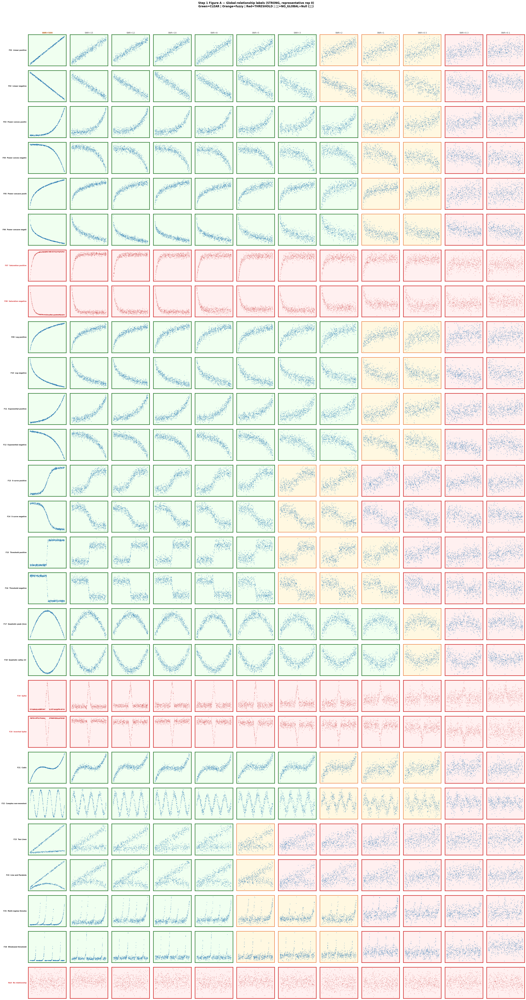

In [3]:
# ── Visual Grid: 每个 family × SNR 的 scatter plot ──
snr_levels = [500.0, 15.0, 12.0, 10.0, 8.0, 5.0, 3.0, 2.0, 1.0, 0.5, 0.3, 0.1]

finite_snrs = all_cases[np.isfinite(all_cases['snr_float'])]['snr_float'].unique()
actual_snrs = []
for s in snr_levels:
    closest = finite_snrs[np.argmin(np.abs(finite_snrs - s))]
    actual_snrs.append(closest)

def find_col(target_snr):
    diffs = [abs(s - target_snr) for s in snr_levels]
    return diffs.index(min(diffs))

n_cols = len(actual_snrs)
n_rows = len(ALL_FIDS)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(2.8 * n_cols, 2.3 * n_rows))

for ri, fid in enumerate(ALL_FIDS):
    fam_cases = all_cases[
        (all_cases['family_id'] == fid) & (all_cases['replicate'] == 0)
    ]
    is_noglobal = fid in NO_GLOBAL or fid == 'Null'
    clear_col = find_col(CLEAR_SNR[fid]) if fid in CLEAR_SNR else None
    thresh_col = find_col(THRESHOLD_SNR[fid]) if fid in THRESHOLD_SNR else None

    for ci, snr_val in enumerate(actual_snrs):
        ax = axes[ri, ci]
        match = fam_cases[fam_cases['snr_float'] == snr_val]
        if len(match) > 0:
            cid = match.iloc[0]['case_id']
            idx = case_idx_map[cid]
            x, y = x_all[idx], y_all[idx]
            dot_color = '#c62828' if is_noglobal else '#1a6faf'
            dot_alpha = 0.3 if is_noglobal else 0.45
            ax.scatter(x, y, s=6, alpha=dot_alpha, color=dot_color,
                       edgecolors='none', rasterized=True)
        ax.set_xticks([]); ax.set_yticks([])

        if is_noglobal:
            for sp in ax.spines.values(): sp.set_linewidth(2.5); sp.set_color('#d32f2f')
            ax.set_facecolor('#fff0f0')
        else:
            is_clear = (clear_col is not None and ci <= clear_col)
            is_thresh = (thresh_col is not None and ci >= thresh_col)
            is_fuzzy = False
            if clear_col is not None and thresh_col is not None:
                is_fuzzy = (thresh_col < ci < clear_col) or (clear_col < ci < thresh_col)

            if is_clear:
                for sp in ax.spines.values(): sp.set_linewidth(2.5); sp.set_color('#2e7d32')
                ax.set_facecolor('#f0fff0')
            elif is_thresh:
                for sp in ax.spines.values(): sp.set_linewidth(2.5); sp.set_color('#d32f2f')
                ax.set_facecolor('#fff0f0')
            elif is_fuzzy:
                for sp in ax.spines.values(): sp.set_linewidth(1.5); sp.set_color('#E65100')
                ax.set_facecolor('#fff8e1')
            else:
                for sp in ax.spines.values(): sp.set_linewidth(0.4); sp.set_color('#cccccc')

        if ri == 0:
            label = f'SNR=∞' if np.isinf(snr_levels[ci]) else f'SNR={int(snr_levels[ci])}' if snr_levels[ci] >= 1 else f'SNR={snr_levels[ci]}'
            ax.set_title(label, fontsize=9,
                         fontweight='bold' if ci == 0 else 'normal',
                         color='#333333' if ci > 0 else '#b45309')
        if ci == 0:
            color_txt = '#d32f2f' if is_noglobal else '#1a1a1a'
            ax.set_ylabel(f'{fid}  {SHORT[fid][:20]}',
                          fontsize=7, fontweight='bold', rotation=0,
                          ha='right', va='center', labelpad=8, color=color_txt)

fig.suptitle('Step 1 Figure A — Global-relationship labels (STRONG, representative rep 0)\n'
             'Green=CLEAR | Orange=fuzzy | Red=THRESHOLD | 红框=NO_GLOBAL+Null (反例)',
             fontsize=12, fontweight='bold', y=0.998)
plt.subplots_adjust(left=0.08, right=0.995, top=0.965, bottom=0.005,
                    hspace=0.15, wspace=0.10)
plt.savefig(OUT_DIR / 'step1_figure_A_labels.png', dpi=150, bbox_inches='tight')
plt.show()


In [4]:
# ── 通用 visual grid 函数（后面各 step 复用）──
def plot_visual_grid(fids, clear_dict, thresh_dict, title, neg_fids=None):
    """
    画 scatter plot grid: 每行一个 family, 每列一个 SNR level.
    fids: 要显示的 family list
    clear_dict: {fid: CLEAR_SNR} (正例)
    thresh_dict: {fid: THRESHOLD_SNR} (正例)
    neg_fids: 反例 family list (永远 label=0, 不画边框, 灰色标题)
    """
    if neg_fids is None:
        neg_fids = []
    all_show = fids

    n_cols = len(actual_snrs)
    n_rows = len(all_show)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(2.8 * n_cols, 2.3 * n_rows))
    if n_rows == 1:
        axes = axes[np.newaxis, :]

    for ri, fid in enumerate(all_show):
        fam_cases = all_cases[
            (all_cases['family_id'] == fid) & (all_cases['replicate'] == 0)
        ]
        is_neg = fid in neg_fids
        clear_col = find_col(clear_dict[fid]) if (fid in clear_dict and not is_neg) else None
        thresh_col = find_col(thresh_dict[fid]) if (fid in thresh_dict and not is_neg) else None

        for ci, snr_val in enumerate(actual_snrs):
            ax = axes[ri, ci]
            match = fam_cases[fam_cases['snr_float'] == snr_val]
            if len(match) > 0:
                cid = match.iloc[0]['case_id']
                idx = case_idx_map[cid]
                x, y = x_all[idx], y_all[idx]
                ax.scatter(x, y, s=6, alpha=0.45,
                           color='#999999' if is_neg else '#1a6faf',
                           edgecolors='none', rasterized=True)
            ax.set_xticks([]); ax.set_yticks([])

            is_clear = (clear_col is not None and ci <= clear_col)
            is_thresh = (thresh_col is not None and ci >= thresh_col)
            is_fuzzy = False
            if clear_col is not None and thresh_col is not None:
                is_fuzzy = min(clear_col, thresh_col) < ci < max(clear_col, thresh_col)

            if is_neg:
                for sp in ax.spines.values(): sp.set_linewidth(0.4); sp.set_color('#cccccc')
                ax.set_facecolor('#f5f5f5')
            elif is_clear:
                for sp in ax.spines.values(): sp.set_linewidth(2.5); sp.set_color('#2e7d32')
                ax.set_facecolor('#f0fff0')
            elif is_thresh:
                for sp in ax.spines.values(): sp.set_linewidth(2.5); sp.set_color('#d32f2f')
                ax.set_facecolor('#fff0f0')
            elif is_fuzzy:
                for sp in ax.spines.values(): sp.set_linewidth(1.5); sp.set_color('#E65100')
                ax.set_facecolor('#fff8e1')
            else:
                for sp in ax.spines.values(): sp.set_linewidth(0.4); sp.set_color('#cccccc')

            if ri == 0:
                label = f'SNR=∞' if np.isinf(snr_levels[ci]) else f'SNR={int(snr_levels[ci])}' if snr_levels[ci] >= 1 else f'SNR={snr_levels[ci]}'
                ax.set_title(label, fontsize=9)
            if ci == 0:
                color = '#999999' if is_neg else '#1a1a1a'
                ax.set_ylabel(f'{fid}  {SHORT.get(fid,"")[:18]}',
                              fontsize=7, fontweight='bold', rotation=0,
                              ha='right', va='center', labelpad=8, color=color)

    fig.suptitle(title, fontsize=12, fontweight='bold', y=0.998)
    plt.subplots_adjust(left=0.08, right=0.995, top=0.965, bottom=0.005,
                        hspace=0.15, wspace=0.10)
    return fig

print('plot_visual_grid() 定义完成')

plot_visual_grid() 定义完成


## Step 1 — MIC Fuzzy Calibration

**Gate question**: "X 和 Y 之间有没有 global relationship？"  
**Hard threshold**: MIC ≥ 0.8  
**Indicator**: MIC (each replicate is one calibration case)

### Labeling logic
Each replicate keeps its own MIC and inherits the human label of its (family, SNR):
- **Yes = 1**: SNR ≥ CLEAR_SNR → relationship clearly visible
- **No = 0**: SNR ≤ THRESHOLD_SNR → no recognizable relationship
- **Uncertain = 0.5**: in between
- **F07/F08 (Saturation), F19/F20 (Spike)**: always 0 (no global relationship)
- **Null**: always 0

Then fit L and U with all replicate-level calibration points.

In [5]:
# ── Replicate-level calibration cases; labels are shared within family × SNR ──
def assign_label(row):
    fid = row['family_id']
    snr = row['snr_float']
    if fid == 'Null' or fid in NO_GLOBAL:
        return 0.0
    if fid not in CLEAR_SNR:
        return np.nan
    if snr >= CLEAR_SNR[fid]:
        return 1.0
    elif snr <= THRESHOLD_SNR[fid]:
        return 0.0
    else:
        return 0.5

strong['label'] = strong.apply(assign_label, axis=1)
strong['abs_rho'] = strong['spearman_rho'].abs()
strong['abs_r'] = strong['pearson_r'].abs()

labeled = strong.dropna(subset=['label']).copy()

print(f'Total replicate-level labeled cases: {len(labeled)}')
print(f'  Yes (1.0):       {(labeled["label"] == 1.0).sum()}')
print(f'  No (0.0):        {(labeled["label"] == 0.0).sum()}')
print(f'  Uncertain (0.5): {(labeled["label"] == 0.5).sum()}')

Total replicate-level labeled cases: 55620
  Yes (1.0):       18380
  No (0.0):        31020
  Uncertain (0.5): 6220


In [6]:
# Duplicate MIC-vs-label diagnostic removed; see Step 1 Figure B.

## Fit L, U for MIC

**自动拟合** → 遍历所有 (L, U) 组合，找 MSE 最小的那对作为起点。

看完下面的图之后，如果觉得 L 或 U 需要调整，直接改 `MIC_L_override` / `MIC_U_override`。

- **L** = MIC 低于这个值 → μ=0（肯定没有 global relationship）
- **U** = MIC 高于这个值 → μ=1（肯定有 global relationship）
- L < MIC < U → 线性过渡（不确定区间）

In [7]:
# ── 手动覆盖（看完图后如果要调整，在这里改） ──
MIC_L_override = None   # 例如 0.3
MIC_U_override = None   # 例如 0.85

# ── fuzzy 函数定义 ──
def fuzzy_mu(z, L, U):
    """z ≤ L → 0, z ≥ U → 1, 中间线性过渡"""
    if U == L:
        return 1.0 if z >= U else 0.0
    return np.clip((z - L) / (U - L), 0.0, 1.0)

def mse_fuzzy(L, U, vals, labels):
    vals = np.asarray(vals, dtype=float)
    labels = np.asarray(labels, dtype=float)
    preds = np.clip((vals - L) / (U - L), 0.0, 1.0)
    return np.mean((preds - labels) ** 2)

# ── 自动拟合: 遍历 (L, U) 找 MSE 最小 ──
mic_vals = labeled['MIC'].values
labels_arr = labeled['label'].values

best_mse = np.inf
best_L, best_U = 0.0, 1.0
for L_c in np.arange(0.05, 0.95, 0.01):
    for U_c in np.arange(L_c + 0.02, 1.0, 0.01):
        m = mse_fuzzy(L_c, U_c, mic_vals, labels_arr)
        if m < best_mse:
            best_mse = m
            best_L, best_U = L_c, U_c

print(f'自动拟合结果:  L = {best_L:.3f},  U = {best_U:.3f},  MSE = {best_mse:.4f}')

# 如果有手动覆盖就用手动的
MIC_L = MIC_L_override if MIC_L_override is not None else best_L
MIC_U = MIC_U_override if MIC_U_override is not None else best_U
if MIC_L_override is not None or MIC_U_override is not None:
    print(f'手动覆盖后:    L = {MIC_L:.3f},  U = {MIC_U:.3f}')
else:
    print('（没有手动覆盖，使用自动拟合结果）')

自动拟合结果:  L = 0.170,  U = 0.880,  MSE = 0.0817
（没有手动覆盖，使用自动拟合结果）


In [8]:
# ── 通用图：实际 indicator/label + 分段线性 fuzzy gate ──
def plot_calibrated_gate(ax, values, human_labels, L, U, indicator_name, title,
                         alpha=0.5, hard_threshold=None, increasing=True):
    """展示 calibration 数据、[L,U] fuzzy range、membership curve 和 alpha-cut。"""
    values = np.asarray(values, dtype=float)
    human_labels = np.asarray(human_labels, dtype=float)
    keep = np.isfinite(values) & np.isfinite(human_labels)
    values, human_labels = values[keep], human_labels[keep]

    # 实际 calibration points：保留它们才能看到 indicator 是否真的支持人工标签。
    rng = np.random.default_rng(20260715)
    point_styles = {
        0.0: ('No', '#d32f2f', 'x'),
        0.5: ('Uncertain', '#f57c00', 's'),
        1.0: ('Yes', '#2e7d32', 'o'),
    }
    for y_value, (name, color, marker) in point_styles.items():
        mask = np.isclose(human_labels, y_value)
        if not mask.any():
            continue
        jitter = rng.uniform(-0.025, 0.025, mask.sum())
        ax.scatter(values[mask], human_labels[mask] + jitter,
                   c=color, marker=marker, s=22, alpha=0.32,
                   label=f'{name} (n={mask.sum()})', edgecolors='none', zorder=2)

    anchors = [np.nanmin(values), np.nanmax(values), L, U]
    if hard_threshold is not None:
        anchors.append(hard_threshold)
    lo, hi = min(anchors), max(anchors)
    if lo >= 0 and hi <= 1.05:
        x_min, x_max = 0.0, 1.0
    else:
        pad = 0.05 * max(hi - lo, 1e-9)
        x_min, x_max = lo - pad, hi + pad

    grid = np.linspace(x_min, x_max, 400)
    if increasing:
        mu_grid = np.clip((grid - L) / (U - L), 0.0, 1.0)
        alpha_x = L + alpha * (U - L)
    else:
        mu_grid = np.clip((U - grid) / (U - L), 0.0, 1.0)
        alpha_x = U - alpha * (U - L)

    ax.axvspan(L, U, color='#f57c00', alpha=0.08, label='Fuzzy range [L, U]', zorder=0)
    ax.plot(grid, mu_grid, color='black', lw=2.4,
            label=f'Piecewise μ: L={L:.3f}, U={U:.3f}', zorder=4)
    ax.axvline(L, color='#d32f2f', ls=':', lw=1.2, label=f'L={L:.3f}')
    ax.axvline(U, color='#2e7d32', ls=':', lw=1.2, label=f'U={U:.3f}')
    ax.axhline(alpha, color='#f57c00', ls='--', lw=1.1, label=f'α={alpha:.2f}')
    ax.axvline(alpha_x, color='#f57c00', ls='--', lw=1.1,
               label=f'α-cut at {indicator_name}={alpha_x:.3f}')
    if hard_threshold is not None:
        ax.axvline(hard_threshold, color='gray', ls='--', lw=1.0, alpha=0.7,
                   label=f'Hard={hard_threshold:g}')

    ax.set_xlabel(indicator_name, fontsize=11)
    ax.set_ylabel('μ / human label', fontsize=11)
    ax.set_title(title, fontsize=11, fontweight='bold')
    ax.set_xlim(x_min - 0.02 * (x_max - x_min), x_max + 0.02 * (x_max - x_min))
    ax.set_ylim(-0.12, 1.12)
    ax.set_yticks([0, 0.5, 1])
    ax.set_yticklabels(['No (0)', 'Uncertain (0.5)', 'Yes (1)'])
    ax.grid(True, alpha=0.15)
    ax.legend(fontsize=7, loc='center left', bbox_to_anchor=(1.01, 0.5))
    return alpha_x


In [9]:
# Duplicate MIC overlay removed; see Step 1 Figure B.

## Per-Family Residual Check

Check which families are well-fit vs poorly-fit by the single MIC fuzzy curve.
If some families have large residuals, they may need Step 1 annotation adjustment.

In [10]:
# # ── Per-family MSE ──
# labeled['mu_pred'] = labeled['MIC'].apply(lambda m: fuzzy_mu(m, MIC_L, MIC_U))
# labeled['residual'] = labeled['mu_pred'] - labeled['label']

# fam_mse = labeled.groupby('family_id').agg(
#     mse=('residual', lambda x: (x ** 2).mean()),
#     mae=('residual', lambda x: x.abs().mean()),
#     n_points=('label', 'count'),
# ).sort_values('mse', ascending=False)

# print('Per-family fit quality (sorted by MSE, worst first):')
# print()
# display(fam_mse.round(4))

# # Plot per-family MSE
# fig, ax = plt.subplots(figsize=(12, 4))
# fam_mse_sorted = fam_mse.reset_index()
# bar_colors = ['#d32f2f' if m > 0.05 else '#1976D2' for m in fam_mse_sorted['mse']]
# ax.bar(fam_mse_sorted['family_id'], fam_mse_sorted['mse'], color=bar_colors)
# ax.axhline(0.05, color='gray', ls='--', lw=1, alpha=0.5, label='MSE = 0.05')
# ax.set_xlabel('Family', fontsize=11)
# ax.set_ylabel('MSE', fontsize=11)
# ax.set_title('Per-Family MSE: MIC Fuzzy Curve vs Human Labels', fontsize=12, fontweight='bold')
# ax.legend(fontsize=9)
# plt.xticks(rotation=45, ha='right')
# plt.tight_layout()
# plt.savefig(OUT_DIR / 'fuzzy_step1_per_family_mse.png', dpi=150, bbox_inches='tight')
# plt.show()

# print(f'\nOverall MSE: {(labeled["residual"] ** 2).mean():.4f}')

## Replicate-level membership and routing

Each replicate is one scatter case and receives its own continuous μ.
The tree uses μ ≥ α for the Yes branch and μ < α for the No branch.
Family × SNR summaries are diagnostic only and do not control routing.

The continuous μ is retained even after the alpha-cut.

In [11]:
# ── Step 1 per-replicate membership and branch ──
# Q10/Q50/Q90 are not used for routing: every scatter realization is one case.
ALPHA = 0.5
strong['mu_s1'] = strong['MIC'].apply(lambda v: fuzzy_mu(v, MIC_L, MIC_U))
strong['pass_s1'] = strong['mu_s1'] >= ALPHA
step1_pass_case_ids = set(strong.loc[strong['pass_s1'], 'case_id'])

print('Step 1 replicate-level routing:')
print(f'  total cases: {len(strong)}')
print(f'  pass: {strong["pass_s1"].sum()}')
print(f'  reject: {(~strong["pass_s1"]).sum()}')

step1_summary = strong.groupby(['family_id', 'snr_float']).agg(
    n_reps=('case_id', 'size'),
    mu_mean=('mu_s1', 'mean'),
    pass_rate=('pass_s1', 'mean'),
).reset_index()
# Summary-only pair set for family × SNR diagnostic plots; it does not route cases.
step1_visible_pairs = set(zip(
    step1_summary.loc[step1_summary['pass_rate'] > 0, 'family_id'],
    step1_summary.loc[step1_summary['pass_rate'] > 0, 'snr_float'],
))

Step 1 replicate-level routing:
  total cases: 55620
  pass: 23487
  reject: 32133


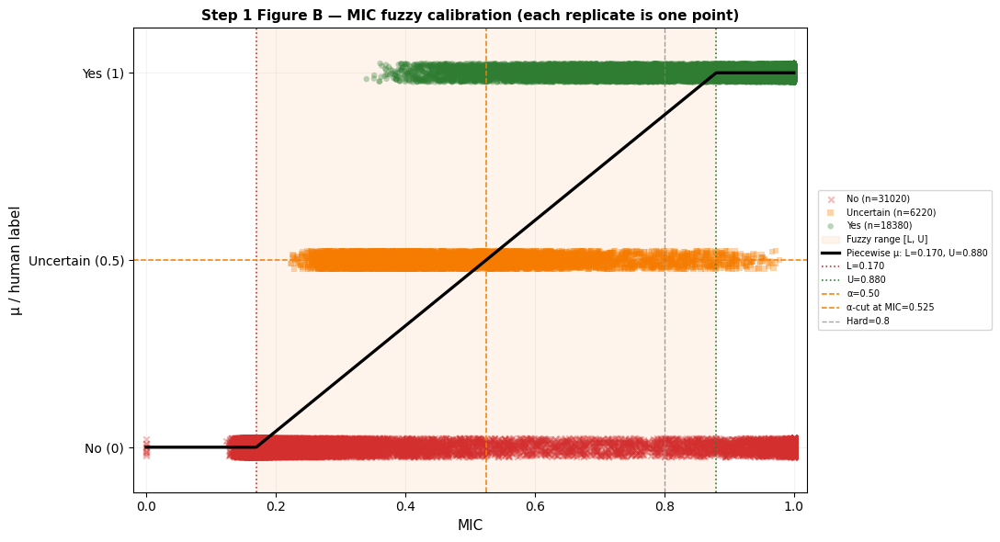

Step 1: alpha=0.50 corresponds to MIC=0.525


In [12]:
# ── Step 1 calibrated gate：piecewise μ(MIC) + 实际 MIC calibration points ──
# L/U 在 MIC 轴上；alpha 在 membership 轴上；橙色竖线是 alpha 对应的实际 MIC cut。
ALPHA=0.50
fig, ax = plt.subplots(figsize=(11, 6))
step1_alpha_mic = plot_calibrated_gate(
    ax, labeled['MIC'].values, labeled['label'].values,
    MIC_L, MIC_U, 'MIC',
    'Step 1 Figure B — MIC fuzzy calibration (each replicate is one point)',
    alpha=ALPHA, hard_threshold=0.8, increasing=True,
)
plt.tight_layout()
plt.savefig(OUT_DIR / 'step1_figure_B_fuzzy.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Step 1: alpha={ALPHA:.2f} corresponds to MIC={step1_alpha_mic:.3f}')


## Save & Summary

Save the calibrated fuzzy parameters for Step 1 (MIC gate).
These will be loaded by the full decision tree notebook.

In [13]:
# ── Step 1 MIC — Summary ──
print('═' * 50)
print('Step 1 MIC Fuzzy Calibration')
print(f'  L = {MIC_L:.3f}  (below → μ=0, definitely No)')
print(f'  U = {MIC_U:.3f}  (above → μ=1, definitely Yes)')
print(f'  Hard threshold was: MIC ≥ 0.8')
print(f'  Overall MSE: {best_mse:.4f}')
print('═' * 50)

══════════════════════════════════════════════════
Step 1 MIC Fuzzy Calibration
  L = 0.170  (below → μ=0, definitely No)
  U = 0.880  (above → μ=1, definitely Yes)
  Hard threshold was: MIC ≥ 0.8
  Overall MSE: 0.0817
══════════════════════════════════════════════════


---

## Step 2 — Simple / Complex: |ρ|, |r|, signal change

**前置条件**: 通过 Step 1 (MIC ≥ 0.8) 的 family  
**Gate question**: "这个 relationship 看起来像 simple（单调 + 近似线性）还是 complex？"  
**Hard threshold**: |ρ| ≥ 0.7 AND |r| ≥ 0.7 AND signal change ≤ 1  
**Indicators**: |Spearman ρ|, |Pearson r|, signal change count

### Family 分组
- **Simple (正例, label=1)**: F01–F14 — 在高 SNR 下呈现单调关系（含 S-curve）
- **Complex (反例, label=0)**: F15–F18, F21–F26 — 非单调或不连续
- F19/F20 和 Null 已在 Step 1 被过滤，不参与 Step 2

先画 |ρ| 和 |r| 的诊断图，然后设标注阈值。  
（signal change 指标暂未纳入 fuzzy fitting，后续 Step 可扩展）

In [14]:
# ══════════════════════════════════════════════════════
#  Step 2 标注 — 修改这里
# ══════════════════════════════════════════════════════
# 前置条件: 该 replicate 的 Step 1 membership 通过 alpha-cut
# 问题: "在这个 SNR 下，能看出来这是 simple (单调) 吗？"
#
# 分组:
#   Simple (确定):    F01-F06, F09-F12 (明显的单调函数)
#   Uncertain:        F13-F16 (S-curve/Threshold, 不确定是 simple 还是 complex)
#   Complex (确定):   F17-F18, F21-F26 (明显的非单调)
#   NO_GLOBAL:        F07/F08, F19/F20 (Step 1 已排除)

SIMPLE_FAMILIES = ['F01','F02','F03','F04','F05','F06',
                   'F09','F10','F11','F12']
UNCERTAIN_FAMILIES = ['F13','F14','F15','F16']
COMPLEX_FAMILIES = [f'F{i:02d}' for i in range(15, 27)
                    if f'F{i:02d}' not in NO_GLOBAL
                    and f'F{i:02d}' not in ['F13','F14','F15','F16']]

CLEAR_SNR_S2 = {
    'F01': 2.0, 'F02': 2.0, 'F03': 2.0, 'F04': 2.0,
    'F05': 3.0, 'F06': 3.0,
    'F09': 3.0, 'F10': 3.0, 'F11': 3.0, 'F12': 3.0,
}
THRESHOLD_SNR_S2 = {
    'F01': 0.3, 'F02': 0.3, 'F03': 0.3, 'F04': 0.3,
    'F05': 0.5, 'F06': 0.5,
    'F09': 0.5, 'F10': 0.5, 'F11': 0.5, 'F12': 0.5,
}

# ── Replicate-level Step 1 routing ──
step2_fids = sorted(set(strong.loc[strong['pass_s1'], 'family_id']) - set(NO_GLOBAL) - {'Null'})

print(f'Step 1 passed replicates: {int(strong["pass_s1"].sum())}')
print(f'Step 2 参与的 family: {len(step2_fids)} 个: {step2_fids}')
print()
print('Step 2 标注 (Simple 正例):')
for fid in SIMPLE_FAMILIES:
    if fid in step2_fids and fid in CLEAR_SNR_S2:
        print(f'  {fid} {SHORT[fid][:25]:<25s}  CLEAR={CLEAR_SNR_S2[fid]:>5.1f}  THRESH={THRESHOLD_SNR_S2[fid]:>5.1f}')
print(f'\nUncertain families (label=0.5): {[f for f in UNCERTAIN_FAMILIES if f in step2_fids]}')
print(f'Complex families (反例, label=0): {[f for f in COMPLEX_FAMILIES if f in step2_fids]}')

# ── Visual Grid: 所有通过 Step 1 的 families ──
show_fids = [f for f in SIMPLE_FAMILIES + UNCERTAIN_FAMILIES + COMPLEX_FAMILIES if f in step2_fids]
n_cols = len(actual_snrs)
n_rows = len(show_fids)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(2.8 * n_cols, 2.3 * n_rows))
if n_rows == 1:
    axes = axes[np.newaxis, :]

for ri, fid in enumerate(show_fids):
    fam_cases = all_cases[
        (all_cases['family_id'] == fid) & (all_cases['replicate'] == 0)
    ]
    is_complex = fid in COMPLEX_FAMILIES
    is_uncertain = fid in UNCERTAIN_FAMILIES
    is_simple = fid in SIMPLE_FAMILIES

    for ci, snr_val in enumerate(actual_snrs):
        ax = axes[ri, ci]
        match = fam_cases[fam_cases['snr_float'] == snr_val]
        in_step1 = len(match) > 0 and match.iloc[0]['case_id'] in step1_pass_case_ids
        if len(match) > 0:
            cid = match.iloc[0]['case_id']
            idx = case_idx_map[cid]
            x, y = x_all[idx], y_all[idx]
            if not in_step1:
                dot_color, dot_alpha = '#cccccc', 0.2
            elif is_complex:
                dot_color, dot_alpha = '#c62828', 0.45
            elif is_uncertain:
                dot_color, dot_alpha = '#b06000', 0.45
            else:
                dot_color, dot_alpha = '#2e7d32', 0.45
            ax.scatter(x, y, s=6, alpha=dot_alpha,
                       color=dot_color, edgecolors='none', rasterized=True)
        ax.set_xticks([]); ax.set_yticks([])

        if not in_step1:
            for sp in ax.spines.values(): sp.set_linewidth(0.3); sp.set_color('#e0e0e0')
            ax.set_facecolor('#6B6B6B')
        elif is_complex:
            for sp in ax.spines.values(): sp.set_linewidth(2.5); sp.set_color('#d32f2f')
            ax.set_facecolor('#fff0f0')
        elif is_uncertain:
            for sp in ax.spines.values(): sp.set_linewidth(1.5); sp.set_color('#E65100')
            ax.set_facecolor('#fff8e1')
        elif is_simple:
            for sp in ax.spines.values(): sp.set_linewidth(2.0); sp.set_color('#2e7d32')
            ax.set_facecolor('#f0fff0')

        if ri == 0:
            label = f'SNR=∞' if np.isinf(snr_levels[ci]) else f'SNR={int(snr_levels[ci])}' if snr_levels[ci] >= 1 else f'SNR={snr_levels[ci]}'
            ax.set_title(label, fontsize=9)
        if ci == 0:
            if is_complex:
                color_txt = '#d32f2f'
            elif is_uncertain:
                color_txt = '#E65100'
            else:
                color_txt = '#2e7d32'
            ax.set_ylabel(f'{fid}  {SHORT.get(fid,"")[:18]}',
                          fontsize=7, fontweight='bold', rotation=0,
                          ha='right', va='center', labelpad=8, color=color_txt)

fig.suptitle('Step 2 Figure A — "能看出来是 simple 吗？" (representative rep 0)\n'
             '灰底=S1 rejected | 绿=Simple(正例) | 橙框=Uncertain(F13-16) | 红框=Complex(反例)',
             fontsize=11, fontweight='bold', y=0.998)
plt.subplots_adjust(left=0.08, right=0.995, top=0.965, bottom=0.005,
                    hspace=0.15, wspace=0.10)
plt.savefig(OUT_DIR / 'step2_figure_A_labels.png', dpi=150, bbox_inches='tight')
plt.show()

Step 1 passed replicates: 23487
Step 2 参与的 family: 22 个: ['F01', 'F02', 'F03', 'F04', 'F05', 'F06', 'F09', 'F10', 'F11', 'F12', 'F13', 'F14', 'F15', 'F16', 'F17', 'F18', 'F21', 'F22', 'F23', 'F24', 'F25', 'F26']

Step 2 标注 (Simple 正例):
  F01 Linear positive            CLEAR=  2.0  THRESH=  0.3
  F02 Linear negative            CLEAR=  2.0  THRESH=  0.3
  F03 Power convex positive      CLEAR=  2.0  THRESH=  0.3
  F04 Power convex negative      CLEAR=  2.0  THRESH=  0.3
  F05 Power concave positive     CLEAR=  3.0  THRESH=  0.5
  F06 Power concave negative     CLEAR=  3.0  THRESH=  0.5
  F09 Log positive               CLEAR=  3.0  THRESH=  0.5
  F10 Log negative               CLEAR=  3.0  THRESH=  0.5
  F11 Exponential positive       CLEAR=  3.0  THRESH=  0.5
  F12 Exponential negative       CLEAR=  3.0  THRESH=  0.5

Uncertain families (label=0.5): ['F13', 'F14', 'F15', 'F16']
Complex families (反例, label=0): ['F17', 'F18', 'F21', 'F22', 'F23', 'F24', 'F25', 'F26']


In [947]:
# Extra family diagnostic removed; Step 2 keeps Figure A and Figure B only.

In [948]:
# ── Step 2 replicate-level labels + auto-fit ──

# Each replicate keeps its own indicators and inherits its family × SNR label.
def assign_label_s2(row):
    fid = row['family_id']
    snr = row['snr_float']
    if not row['pass_s1']:
        return np.nan
    if fid in COMPLEX_FAMILIES:
        return 0.0
    if fid in UNCERTAIN_FAMILIES:
        return 0.5
    if fid not in CLEAR_SNR_S2:
        return np.nan
    if snr >= CLEAR_SNR_S2[fid]:
        return 1.0
    elif snr <= THRESHOLD_SNR_S2[fid]:
        return 0.0
    else:
        return 0.5

strong['label_s2'] = strong.apply(assign_label_s2, axis=1)
labeled_s2 = strong.dropna(subset=['label_s2']).copy()

print(f'Step 2 replicate-level labeled cases: {len(labeled_s2)}')
print(f'  Yes={int((labeled_s2["label_s2"]==1).sum())}, No={int((labeled_s2["label_s2"]==0).sum())}, Unc={int((labeled_s2["label_s2"]==0.5).sum())}')

# ── Auto-fit: |ρ| 和 |r| 各自独立 fuzzy (L, U) ──
rho_vals = labeled_s2['abs_rho'].values
r_vals = labeled_s2['abs_r'].values
labels_s2 = labeled_s2['label_s2'].values

best_mse_rho, best_L_rho, best_U_rho = np.inf, 0.0, 1.0
best_mse_r, best_L_r, best_U_r = np.inf, 0.0, 1.0
for L_c in np.arange(0.05, 0.95, 0.01):
    for U_c in np.arange(L_c + 0.02, 1.0, 0.01):
        m_rho = mse_fuzzy(L_c, U_c, rho_vals, labels_s2)
        m_r = mse_fuzzy(L_c, U_c, r_vals, labels_s2)
        if m_rho < best_mse_rho: best_mse_rho, best_L_rho, best_U_rho = m_rho, L_c, U_c
        if m_r < best_mse_r: best_mse_r, best_L_r, best_U_r = m_r, L_c, U_c

print(f'\n各 indicator 独立 fuzzy:')
print(f'  |ρ|  L={best_L_rho:.3f}  U={best_U_rho:.3f}  MSE={best_mse_rho:.4f}')
print(f'  |r|  L={best_L_r:.3f}  U={best_U_r:.3f}  MSE={best_mse_r:.4f}')
print(f'  signal_change: TODO (metric 尚未计算)')
print(f'\nStep 2 最终判定: μ_rho AND μ_r (AND μ_sc) 都要高才算 Simple')

Step 2 replicate-level labeled cases: 18389
  Yes=8626, No=4827, Unc=4936

各 indicator 独立 fuzzy:
  |ρ|  L=0.500  U=0.990  MSE=0.0367
  |r|  L=0.470  U=0.990  MSE=0.0563
  signal_change: TODO (metric 尚未计算)

Step 2 最终判定: μ_rho AND μ_r (AND μ_sc) 都要高才算 Simple


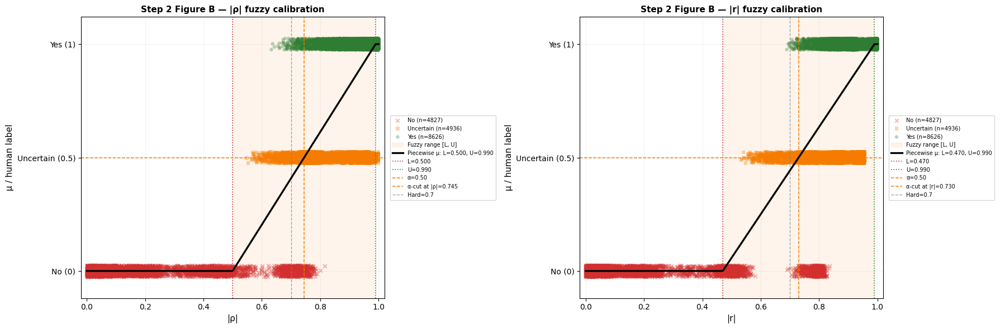

Step 2 alpha-cuts: |ρ|=0.745, |r|=0.730


In [949]:
# ── Step 2 calibrated gates：每个 indicator 的 piecewise membership ──
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
step2_alpha_rho = plot_calibrated_gate(
    axes[0], labeled_s2['abs_rho'].values, labeled_s2['label_s2'].values,
    best_L_rho, best_U_rho, '|ρ|',
    'Step 2 Figure B — |ρ| fuzzy calibration',
    alpha=ALPHA, hard_threshold=0.7, increasing=True,
)
step2_alpha_r = plot_calibrated_gate(
    axes[1], labeled_s2['abs_r'].values, labeled_s2['label_s2'].values,
    best_L_r, best_U_r, '|r|',
    'Step 2 Figure B — |r| fuzzy calibration',
    alpha=ALPHA, hard_threshold=0.7, increasing=True,
)
plt.tight_layout()
plt.savefig(OUT_DIR / 'step2_figure_B_fuzzy.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Step 2 alpha-cuts: |ρ|={step2_alpha_rho:.3f}, |r|={step2_alpha_r:.3f}')


### Step 2 — Replicate-level routing

Each replicate computes μ_rho and μ_r, then uses their minimum as the Simple membership.  
Q10/Q50/Q90 are not used for routing; family × SNR pass rates are summary outputs only.

A replicate enters Step 3 only when it passed Step 1 and μ_simple ≥ α.

In [950]:
# ── Step 2 per-replicate membership and routing ──
strong['mu_rho_s2'] = strong['abs_rho'].apply(lambda v: fuzzy_mu(v, best_L_rho, best_U_rho))
strong['mu_r_s2'] = strong['abs_r'].apply(lambda v: fuzzy_mu(v, best_L_r, best_U_r))
strong['mu_s2'] = np.minimum(strong['mu_rho_s2'], strong['mu_r_s2'])
strong['pass_s2'] = strong['pass_s1'] & (strong['mu_s2'] >= ALPHA)
step2_pass_case_ids = set(strong.loc[strong['pass_s2'], 'case_id'])
step3_fids = sorted(strong.loc[strong['pass_s2'], 'family_id'].unique())

step2_summary = strong.loc[strong['pass_s1']].groupby(['family_id', 'snr_float']).agg(
    n_reps=('case_id', 'size'),
    mu_mean=('mu_s2', 'mean'),
    pass_rate=('pass_s2', 'mean'),
).reset_index()
step2_visible_pairs = set(zip(
    step2_summary.loc[step2_summary['pass_rate'] > 0, 'family_id'],
    step2_summary.loc[step2_summary['pass_rate'] > 0, 'snr_float'],
))
print('Step 2 replicate-level routing:')
print(f'  entered from Step 1: {int(strong["pass_s1"].sum())}')
print(f'  pass to Step 3: {int(strong["pass_s2"].sum())}')
print(f'  families with at least one passing replicate: {step3_fids}')


# No Q10/Q50/Q90 routing: every replicate remains one independent case.

Step 2 replicate-level routing:
  entered from Step 1: 19887
  pass to Step 3: 12730
  families with at least one passing replicate: ['F01', 'F02', 'F03', 'F04', 'F05', 'F06', 'F09', 'F10', 'F11', 'F12', 'F13', 'F14', 'F15', 'F16', 'F21']


---

## Step 3 — Strong Monotonicity: |ρ| Calibration

**前置条件**: replicate-level μ_simple ≥ α
**Gate question**: "单调性是否足够强？"
**Hard threshold**: |ρ| ≥ 0.9
**Indicator**: |Spearman ρ|

### 标注逻辑
- **正例 (F01–F06, F09–F12 Simple)**: 高 SNR 明确强单调 → label=1
- **反例 (F15–F16 Threshold)**: 有跳跃/平台区域，|ρ| 偏低 → label=0
- **Uncertain (F13–F14 S-curve)**: 单调但有拐点，不确定强弱 → label=0.5
- 中间 SNR: 噪声导致 |ρ| 下降 → uncertain

→ μ_mono ≥ α: 进入 Step 4 (Linearity)
→ μ_mono < α: 单调性不够强

Step 3 标注 (Strong Monotonicity):
Strong mono (正例):
  F01 Linear positive            CLEAR= 10.0  THRESH=  0.0
  F02 Linear negative            CLEAR= 10.0  THRESH=  0.0
  F03 Power convex positive      CLEAR= 10.0  THRESH=  0.0
  F04 Power convex negative      CLEAR= 10.0  THRESH=  0.0
  F05 Power concave positive     CLEAR= 10.0  THRESH=  0.0
  F06 Power concave negative     CLEAR= 10.0  THRESH=  0.0
  F09 Log positive               CLEAR= 10.0  THRESH=  0.0
  F10 Log negative               CLEAR= 10.0  THRESH=  0.0
  F11 Exponential positive       CLEAR= 10.0  THRESH=  0.0
  F12 Exponential negative       CLEAR= 10.0  THRESH=  0.0

Uncertain (label=0.5): ['F13', 'F14']
Weak mono (label=0):   ['F15', 'F16']


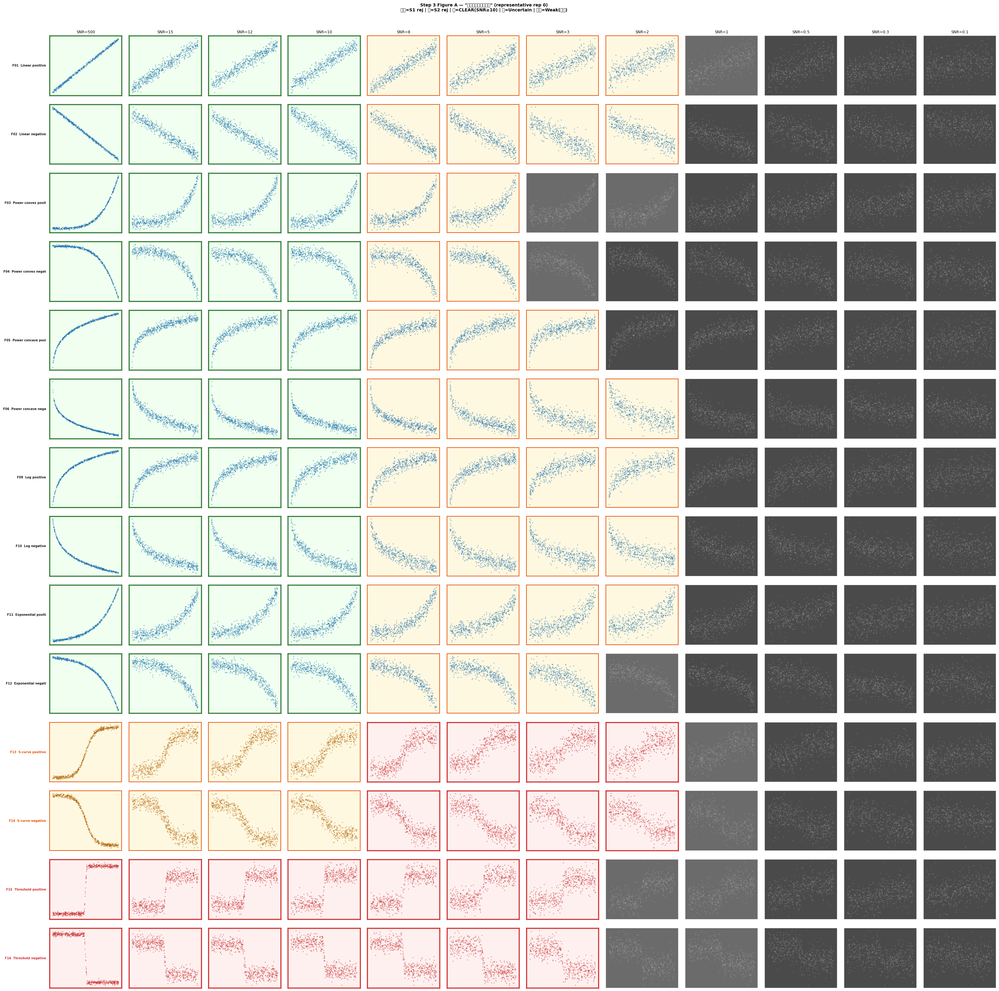

In [951]:
# ══════════════════════════════════════════════════════
#  Step 3 标注 — 修改这里 (Strong Monotonicity |ρ|)
# ══════════════════════════════════════════════════════
# 前置条件: 通过 Step 2 的 Simple + Uncertain family
# 问题: "单调性是否足够强？"
#
# 分组:
#   Strong monotonic (确定): F01-F06, F09-F12
#   Uncertain:               F13-F14 (S-curve, 有拐点)
#   Not strong (确定):       F15-F16 (Threshold, |ρ| 较低)

STRONG_MONO_FAM = ['F01', 'F02', 'F03', 'F04', 'F05', 'F06',
                   'F09', 'F10', 'F11', 'F12']
UNCERTAIN_MONO = ['F13', 'F14']
WEAK_MONO_FAM = ['F15', 'F16']

CLEAR_SNR_S3 = {
    'F01': 10.0, 'F02': 10.0, 'F03': 10.0, 'F04': 10.0,
    'F05': 10.0, 'F06': 10.0,
    'F09': 10.0, 'F10': 10.0, 'F11': 10.0, 'F12': 10.0,
}
THRESHOLD_SNR_S3 = {
    'F01': 0.0, 'F02': 0.0, 'F03': 0.0, 'F04': 0.0,
    'F05': 0.0, 'F06': 0.0,
    'F09': 0.0, 'F10': 0.0, 'F11': 0.0, 'F12': 0.0,
    'F13': 10.0, 'F14': 10.0,
}

print('Step 3 标注 (Strong Monotonicity):')
print('Strong mono (正例):')
for fid in STRONG_MONO_FAM:
    if fid in step3_fids and fid in CLEAR_SNR_S3:
        print(f'  {fid} {SHORT[fid][:25]:<25s}  CLEAR={CLEAR_SNR_S3[fid]:>5.1f}  THRESH={THRESHOLD_SNR_S3[fid]:>5.1f}')
print(f'\nUncertain (label=0.5): {[f for f in UNCERTAIN_MONO if f in step3_fids]}')
print(f'Weak mono (label=0):   {[f for f in WEAK_MONO_FAM if f in step3_fids]}')

# ── Visual Grid ──
show_fids_s3 = [f for f in STRONG_MONO_FAM + UNCERTAIN_MONO + WEAK_MONO_FAM if f in step3_fids]
n_cols = len(actual_snrs)
n_rows = len(show_fids_s3)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(2.8 * n_cols, 2.3 * n_rows))
if n_rows == 1:
    axes = axes[np.newaxis, :]

for ri, fid in enumerate(show_fids_s3):
    fam_cases = all_cases[
        (all_cases['family_id'] == fid) & (all_cases['replicate'] == 0)
    ]
    in_s2 = fid in step3_fids
    is_strong = fid in STRONG_MONO_FAM
    is_uncertain = fid in UNCERTAIN_MONO
    is_weak = fid in WEAK_MONO_FAM
    clear_col = find_col(CLEAR_SNR_S3[fid]) if (fid in CLEAR_SNR_S3 and in_s2) else None

    for ci, snr_val in enumerate(actual_snrs):
        ax = axes[ri, ci]
        match = fam_cases[fam_cases['snr_float'] == snr_val]
        in_step2 = len(match) > 0 and match.iloc[0]['case_id'] in step2_pass_case_ids
        in_step1 = len(match) > 0 and match.iloc[0]['case_id'] in step1_pass_case_ids
        if len(match) > 0:
            cid = match.iloc[0]['case_id']
            idx = case_idx_map[cid]
            x, y = x_all[idx], y_all[idx]
            if not in_step1 or not in_step2:
                dot_color, dot_alpha = '#cccccc', 0.2
            elif is_weak:
                dot_color, dot_alpha = '#c62828', 0.45
            elif is_uncertain:
                if fid in THRESHOLD_SNR_S3 and snr_val <= THRESHOLD_SNR_S3[fid]:
                    dot_color, dot_alpha = '#c62828', 0.45
                else:
                    dot_color, dot_alpha = '#b06000', 0.45
            else:
                dot_color, dot_alpha = '#1a6faf', 0.45
            ax.scatter(x, y, s=6, alpha=dot_alpha,
                       color=dot_color, edgecolors='none', rasterized=True)
        ax.set_xticks([]); ax.set_yticks([])

        if not in_step1:
            for sp in ax.spines.values(): sp.set_linewidth(0.3); sp.set_color('#e0e0e0')
            ax.set_facecolor('#4a4a4a')
        elif not in_step2:
            for sp in ax.spines.values(): sp.set_linewidth(0.3); sp.set_color('#e0e0e0')
            ax.set_facecolor('#6B6B6B')
        elif is_weak:
            for sp in ax.spines.values(): sp.set_linewidth(2.5); sp.set_color('#d32f2f')
            ax.set_facecolor('#fff0f0')
        elif is_uncertain:
            if fid in THRESHOLD_SNR_S3 and snr_val <= THRESHOLD_SNR_S3[fid]:
                for sp in ax.spines.values(): sp.set_linewidth(2.5); sp.set_color('#d32f2f')
                ax.set_facecolor('#fff0f0')
            else:
                for sp in ax.spines.values(): sp.set_linewidth(1.5); sp.set_color('#E65100')
                ax.set_facecolor('#fff8e1')
        elif is_strong:
            if clear_col is not None and ci <= clear_col:
                for sp in ax.spines.values(): sp.set_linewidth(2.5); sp.set_color('#2e7d32')
                ax.set_facecolor('#f0fff0')
            else:
                for sp in ax.spines.values(): sp.set_linewidth(1.5); sp.set_color('#E65100')
                ax.set_facecolor('#fff8e1')
        else:
            for sp in ax.spines.values(): sp.set_linewidth(0.4); sp.set_color('#cccccc')

        if ri == 0:
            label = f'SNR=∞' if np.isinf(snr_levels[ci]) else f'SNR={int(snr_levels[ci])}' if snr_levels[ci] >= 1 else f'SNR={snr_levels[ci]}'
            ax.set_title(label, fontsize=9)
        if ci == 0:
            if is_weak:
                color_txt = '#d32f2f'
            elif is_uncertain:
                color_txt = '#E65100'
            elif not in_s2:
                color_txt = '#999999'
            else:
                color_txt = '#1a1a1a'
            ax.set_ylabel(f'{fid}  {SHORT.get(fid,"")[:18]}',
                          fontsize=7, fontweight='bold', rotation=0,
                          ha='right', va='center', labelpad=8, color=color_txt)

fig.suptitle('Step 3 Figure A — "单调性是否足够强？" (representative rep 0)\n'
             '深灰=S1 rej | 灰=S2 rej | 绿=CLEAR(SNR≥10) | 橙=Uncertain | 红框=Weak(反例)',
             fontsize=10, fontweight='bold', y=0.998)
plt.subplots_adjust(left=0.08, right=0.995, top=0.965, bottom=0.005,
                    hspace=0.15, wspace=0.10)
plt.savefig(OUT_DIR / 'step3_figure_A_labels.png', dpi=150, bbox_inches='tight')
plt.show()


In [952]:
# ── Step 3 replicate-level labels + auto-fit (Strong Monotonicity) ──
def assign_label_s3(row):
    fid = row['family_id']
    snr = row['snr_float']
    if fid not in STRONG_MONO_FAM + UNCERTAIN_MONO + WEAK_MONO_FAM:
        return np.nan
    if not row['pass_s2']:
        return np.nan
    if fid in WEAK_MONO_FAM:
        return 0.0
    if fid in UNCERTAIN_MONO:
        if fid in THRESHOLD_SNR_S3 and snr <= THRESHOLD_SNR_S3[fid]:
            return 0.0
        return 0.5
    if fid not in CLEAR_SNR_S3:
        return np.nan
    if snr >= CLEAR_SNR_S3[fid]:
        return 1.0
    elif snr <= THRESHOLD_SNR_S3[fid]:
        return 0.0
    else:
        return 0.5

strong['label_s3'] = strong.apply(assign_label_s3, axis=1)
labeled_s3 = strong.dropna(subset=['label_s3']).copy()
print(f'Step 3 replicate-level labeled: {len(labeled_s3)}  '
      f'(Yes={int((labeled_s3["label_s3"]==1).sum())}, '
      f'No={int((labeled_s3["label_s3"]==0).sum())}, '
      f'Unc={int((labeled_s3["label_s3"]==0.5).sum())})')

rho_vals_s3 = labeled_s3['abs_rho'].values
labels_s3_arr = labeled_s3['label_s3'].values
best_mse_s3, best_L_s3, best_U_s3 = np.inf, 0.0, 1.0
for L_c in np.arange(0.05, 0.95, 0.01):
    for U_c in np.arange(L_c + 0.02, 1.0, 0.01):
        m = mse_fuzzy(L_c, U_c, rho_vals_s3, labels_s3_arr)
        if m < best_mse_s3:
            best_mse_s3, best_L_s3, best_U_s3 = m, L_c, U_c
print(f'\nAuto-fit |ρ|: L={best_L_s3:.3f} U={best_U_s3:.3f} MSE={best_mse_s3:.4f}')


Step 3 replicate-level labeled: 12599  (Yes=6600, No=2261, Unc=3738)

Auto-fit |ρ|: L=0.730 U=0.990 MSE=0.0498


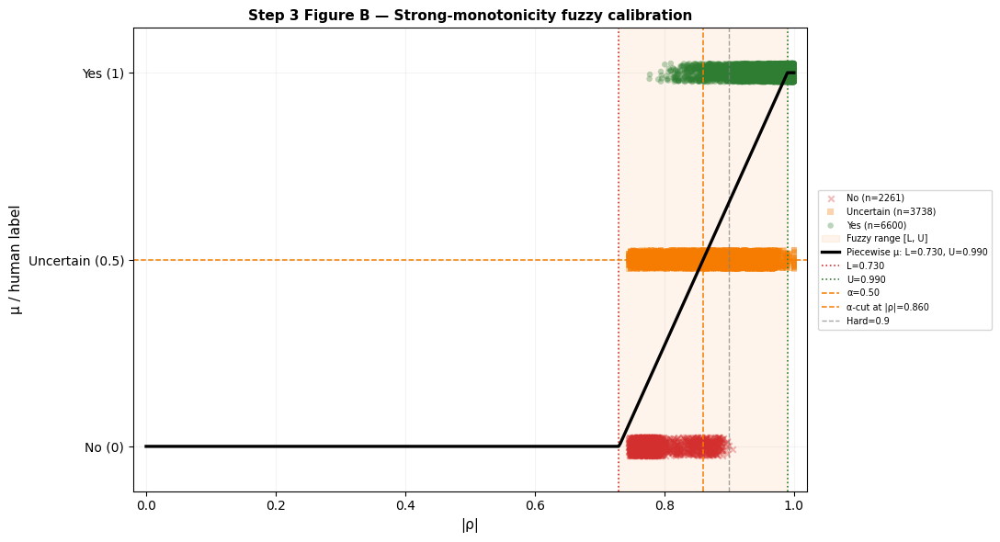

Step 3: alpha=0.50 corresponds to |ρ|=0.860


In [953]:
# ── Step 3 calibrated gate: Strong Monotonicity piecewise membership ──
fig, ax = plt.subplots(figsize=(11, 6))
step3_alpha_rho = plot_calibrated_gate(
    ax, labeled_s3['abs_rho'].values, labeled_s3['label_s3'].values,
    best_L_s3, best_U_s3, '|ρ|',
    'Step 3 Figure B — Strong-monotonicity fuzzy calibration',
    alpha=ALPHA, hard_threshold=0.9, increasing=True,
)
plt.tight_layout()
plt.savefig(OUT_DIR / 'step3_figure_B_fuzzy.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Step 3: alpha={ALPHA:.2f} corresponds to |ρ|={step3_alpha_rho:.3f}')

In [954]:
# ── Step 3 per-replicate membership and routing ──
strong['mu_s3'] = strong['abs_rho'].apply(lambda v: fuzzy_mu(v, best_L_s3, best_U_s3))
strong['pass_s3'] = strong['pass_s2'] & (strong['mu_s3'] >= ALPHA)
step3_pass_case_ids = set(strong.loc[strong['pass_s3'], 'case_id'])
step4_fids = sorted(strong.loc[strong['pass_s3'], 'family_id'].unique())

step3_summary = strong.loc[strong['pass_s2']].groupby(['family_id', 'snr_float']).agg(
    n_reps=('case_id', 'size'),
    mu_mean=('mu_s3', 'mean'),
    pass_rate=('pass_s3', 'mean'),
).reset_index()
print('Step 3 replicate-level routing:')
print(f'  entered from Step 2: {int(strong["pass_s2"].sum())}')
print(f'  pass to Step 4: {int(strong["pass_s3"].sum())}')
print(f'  families with at least one passing replicate: {step4_fids}')


# No Q10/Q50/Q90 routing: every replicate remains one independent case.

Step 3 replicate-level routing:
  entered from Step 2: 12730
  pass to Step 4: 8875
  families with at least one passing replicate: ['F01', 'F02', 'F03', 'F04', 'F05', 'F06', 'F09', 'F10', 'F11', 'F12', 'F13', 'F14']


---

## Step 4 — Linearity: |r| + ΔBIC Dual Fuzzy Calibration

**前置条件**: replicate-level μ_mono ≥ α
**Gate question**: "看散点图，能看出来是直线吗？"

### 双指标
- **|r| (Pearson r 绝对值)**: 线性相关强度，increasing fuzzy gate
- **ΔBIC = BIC_linear − min(BIC_quad, BIC_cubic)**: decreasing line-membership gate
  - ΔBIC 小 → 更支持 Line；ΔBIC 大 → 更支持 Non-line
  - 决策中心固定为 **ΔBIC = 6**；当前 fuzzy half-width 设为 6

### Per-replicate calibration
每个 replicate 是一个独立 calibration case，共享 family × SNR 的人工标签，
但保留自己的 |r| 和 ΔBIC。

### 组合
```
μ_r   = fuzzy_mu(|r|, R_L, R_U)                      # increasing
μ_bic = 1 - fuzzy_mu(ΔBIC, 0, 12)                   # decreasing, μ=0.5 at 6
μ_line = min(μ_r, μ_bic)
```

→ μ_line ≥ α: Line
→ μ_line < α: Non-line → Step 5 (Curvature type)


Computing ΔBIC for Step 4 replicates (decision center=6)...
ΔBIC computed: 8875 / 8875 Step 4 cases
  range: [-6.2, 3391.4]
  median: 705.6

Step 4 标注 (Linearity):
Linear (正例):
  F01 Linear positive            CLEAR=  0.0  THRESH=  0.0
  F02 Linear negative            CLEAR=  0.0  THRESH=  0.0

Uncertain (label=0.5): ['F03', 'F04', 'F05', 'F06', 'F09', 'F10', 'F11', 'F12']
Non-linear (label=0):  ['F13', 'F14']


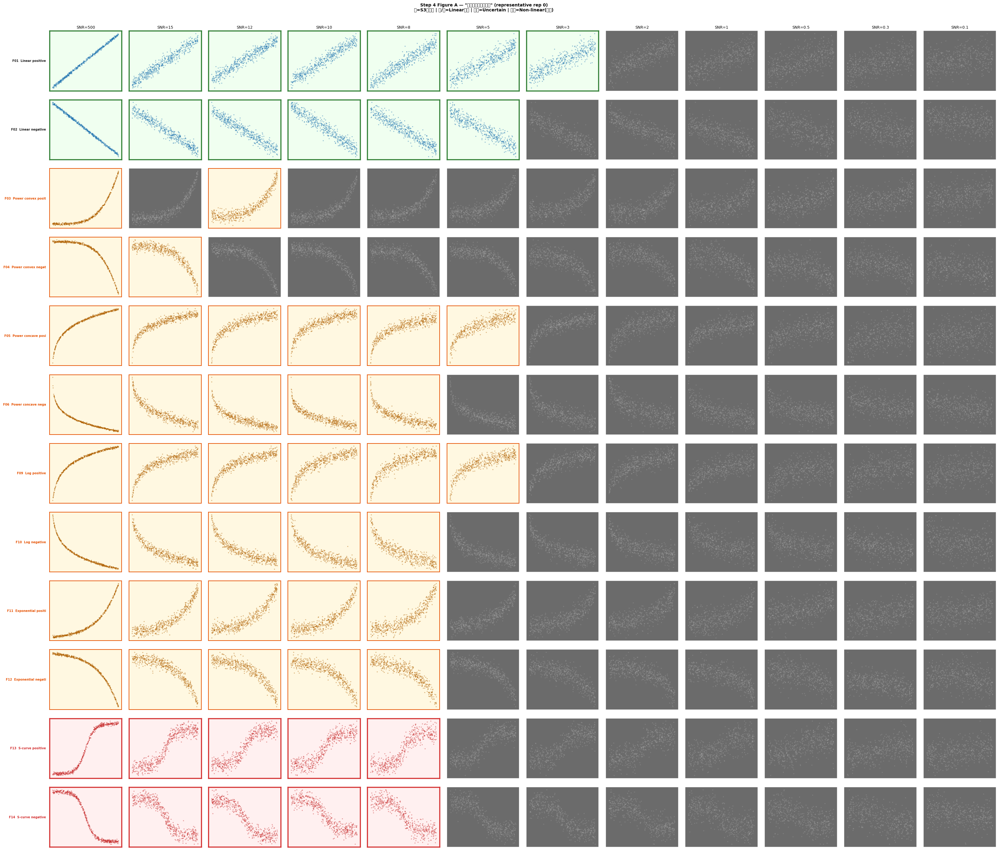

In [955]:
# ══════════════════════════════════════════════════════
#  Step 4 标注 + ΔBIC 计算（决策中心固定为 6）
# ══════════════════════════════════════════════════════
# 分组:
#   Linear (确定):     F01-F02 (明确是直线)
#   Uncertain:         F03-F06, F09-F12 (不确定是不是直线)
#   Non-linear (确定): F13-F16 (明确不是直线)

LINEAR_FAM = ['F01', 'F02']
UNCERTAIN_LINEAR = ['F03', 'F04', 'F05', 'F06',
                    'F09', 'F10', 'F11', 'F12']
NONLINEAR_FAM = ['F13', 'F14', 'F15', 'F16']

CLEAR_SNR_S4 = {
    'F01': 0.0, 'F02': 0.0,
}
THRESHOLD_SNR_S4 = {
    'F01': 0.0, 'F02': 0.0,
}

# ── BIC model comparison ──
def bic_compare(x, y):
    order = np.argsort(x)
    xs = x[order].astype(np.float64)
    ys = y[order].astype(np.float64)
    x_mu, x_sd = xs.mean(), max(xs.std(), 1e-10)
    y_mu, y_sd = ys.mean(), max(ys.std(), 1e-10)
    xn = (xs - x_mu) / x_sd
    yn = (ys - y_mu) / y_sd
    n = len(xn)
    ss_tot = np.sum((yn - yn.mean()) ** 2)

    bics, r2s = {}, {}
    for deg, k in [(1, 2), (2, 3), (3, 4)]:
        coeffs = np.polyfit(xn, yn, deg)
        pred = np.polyval(coeffs, xn)
        rss = np.sum((yn - pred) ** 2)
        r2s[deg] = 1.0 - rss / ss_tot if ss_tot > 1e-30 else 0.0
        bics[deg] = n * np.log(rss / n + 1e-30) + k * np.log(n)

    delta_bic = bics[1] - min(bics[2], bics[3])
    return {'delta_bic': delta_bic, 'r2_1': r2s[1], 'r2_3': r2s[3]}

# ── Compute ΔBIC for each replicate that enters Step 4 ──
DELTA_BIC_CENTER = 6.0
print(f'Computing ΔBIC for Step 4 replicates (decision center={DELTA_BIC_CENTER:g})...')
strong['delta_bic'] = np.nan
for row_idx, row in strong.loc[strong['pass_s3']].iterrows():
    cid = row['case_id']
    if cid not in case_idx_map:
        continue
    idx = case_idx_map[cid]
    x, y = x_all[idx], y_all[idx]
    if len(x) < 10:
        continue
    res = bic_compare(x, y)
    strong.at[row_idx, 'delta_bic'] = res['delta_bic']

print(f'ΔBIC computed: {strong["delta_bic"].notna().sum()} / {int(strong["pass_s3"].sum())} Step 4 cases')
print(f'  range: [{strong["delta_bic"].min():.1f}, {strong["delta_bic"].max():.1f}]')
print(f'  median: {strong["delta_bic"].median():.1f}')

# ── Print annotation summary ──
print('\nStep 4 标注 (Linearity):')
print('Linear (正例):')
for fid in LINEAR_FAM:
    if fid in step4_fids and fid in CLEAR_SNR_S4:
        print(f'  {fid} {SHORT[fid][:25]:<25s}  CLEAR={CLEAR_SNR_S4[fid]:>5.1f}  THRESH={THRESHOLD_SNR_S4[fid]:>5.1f}')
print(f'\nUncertain (label=0.5): {[f for f in UNCERTAIN_LINEAR if f in step4_fids]}')
print(f'Non-linear (label=0):  {[f for f in NONLINEAR_FAM if f in step4_fids]}')

# ── Visual Grid ──
show_fids_s4 = [f for f in LINEAR_FAM + UNCERTAIN_LINEAR + NONLINEAR_FAM if f in step4_fids]
n_cols = len(actual_snrs)
n_rows = len(show_fids_s4)

if n_rows == 0:
    print('Step 4: 没有 family 通过 Step 3，跳过 visual grid')
else:
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(2.8 * n_cols, 2.3 * n_rows))
    if n_rows == 1:
        axes = axes[np.newaxis, :]

    for ri, fid in enumerate(show_fids_s4):
        fam_cases = all_cases[
            (all_cases['family_id'] == fid) & (all_cases['replicate'] == 0)
        ]
        is_linear = fid in LINEAR_FAM
        is_uncertain = fid in UNCERTAIN_LINEAR
        is_nonlinear = fid in NONLINEAR_FAM
        clear_col = find_col(CLEAR_SNR_S4[fid]) if fid in CLEAR_SNR_S4 else None
        thresh_col = find_col(THRESHOLD_SNR_S4[fid]) if fid in THRESHOLD_SNR_S4 else None

        for ci, snr_val in enumerate(actual_snrs):
            ax = axes[ri, ci]
            match = fam_cases[fam_cases['snr_float'] == snr_val]
            in_prev = len(match) > 0 and match.iloc[0]['case_id'] in step3_pass_case_ids
            if len(match) > 0:
                cid = match.iloc[0]['case_id']
                idx = case_idx_map[cid]
                x, y = x_all[idx], y_all[idx]
                if not in_prev:
                    dot_color, dot_alpha = '#cccccc', 0.2
                elif is_nonlinear:
                    dot_color, dot_alpha = '#c62828', 0.45
                elif is_uncertain:
                    dot_color, dot_alpha = '#b06000', 0.45
                else:
                    dot_color, dot_alpha = '#1a6faf', 0.45
                ax.scatter(x, y, s=6, alpha=dot_alpha,
                           color=dot_color, edgecolors='none', rasterized=True)
            ax.set_xticks([]); ax.set_yticks([])

            if not in_prev:
                for sp in ax.spines.values(): sp.set_linewidth(0.3); sp.set_color('#e0e0e0')
                ax.set_facecolor('#6B6B6B')
            elif is_nonlinear:
                for sp in ax.spines.values(): sp.set_linewidth(2.5); sp.set_color('#d32f2f')
                ax.set_facecolor('#fff0f0')
            elif is_uncertain:
                for sp in ax.spines.values(): sp.set_linewidth(1.5); sp.set_color('#E65100')
                ax.set_facecolor('#fff8e1')
            elif is_linear and clear_col is not None:
                is_clear = ci <= clear_col
                is_thresh = ci >= thresh_col if thresh_col is not None else False
                is_fuzzy = False
                if clear_col is not None and thresh_col is not None and clear_col != thresh_col:
                    is_fuzzy = min(clear_col, thresh_col) < ci < max(clear_col, thresh_col)
                if is_clear:
                    for sp in ax.spines.values(): sp.set_linewidth(2.5); sp.set_color('#2e7d32')
                    ax.set_facecolor('#f0fff0')
                elif is_thresh:
                    for sp in ax.spines.values(): sp.set_linewidth(2.5); sp.set_color('#d32f2f')
                    ax.set_facecolor('#fff0f0')
                elif is_fuzzy:
                    for sp in ax.spines.values(): sp.set_linewidth(1.5); sp.set_color('#E65100')
                    ax.set_facecolor('#fff8e1')
                else:
                    for sp in ax.spines.values(): sp.set_linewidth(0.4); sp.set_color('#cccccc')
            else:
                for sp in ax.spines.values(): sp.set_linewidth(0.4); sp.set_color('#cccccc')

            if ri == 0:
                label = 'SNR=∞' if np.isinf(snr_levels[ci]) else f'SNR={int(snr_levels[ci])}' if snr_levels[ci] >= 1 else f'SNR={snr_levels[ci]}'
                ax.set_title(label, fontsize=9)
            if ci == 0:
                if is_nonlinear:
                    color_txt = '#d32f2f'
                elif is_uncertain:
                    color_txt = '#E65100'
                else:
                    color_txt = '#1a1a1a'
                ax.set_ylabel(f'{fid}  {SHORT.get(fid,"")[:18]}',
                              fontsize=7, fontweight='bold', rotation=0,
                              ha='right', va='center', labelpad=8, color=color_txt)

    fig.suptitle('Step 4 Figure A — "能看出来是直线吗？" (representative rep 0)\n'
                 '灰=S3未通过 | 绿/橙=Linear标注 | 橙框=Uncertain | 红框=Non-linear(反例)',
                 fontsize=10, fontweight='bold', y=0.998)
    plt.subplots_adjust(left=0.08, right=0.995, top=0.965, bottom=0.005,
                        hspace=0.15, wspace=0.10)
    plt.savefig(OUT_DIR / 'step4_figure_A_labels.png', dpi=150, bbox_inches='tight')
    plt.show()

In [956]:
# ── Step 4 Per-replicate labels + |r| fit + fixed-center ΔBIC fuzzy gate ──

# ── Assign labels per replicate (shared by family × SNR) ──
def assign_label_s4_rep(row):
    fid = row['family_id']
    snr = row['snr_float']
    if fid not in LINEAR_FAM + UNCERTAIN_LINEAR + NONLINEAR_FAM:
        return np.nan
    if not row['pass_s3']:
        return np.nan
    if fid in NONLINEAR_FAM:
        return 0.0
    if fid in UNCERTAIN_LINEAR:
        return 0.5
    if fid not in CLEAR_SNR_S4:
        return np.nan
    if snr >= CLEAR_SNR_S4[fid]:
        return 1.0
    elif snr <= THRESHOLD_SNR_S4[fid]:
        return 0.0
    else:
        return 0.5

strong['label_s4'] = strong.apply(assign_label_s4_rep, axis=1)
strong['abs_r'] = strong['pearson_r'].abs()
rep_s4 = strong.dropna(subset=['label_s4', 'delta_bic']).copy()

print(f'Step 4 per-replicate labeled: {len(rep_s4)}')
print(f'  Yes={int((rep_s4["label_s4"]==1).sum())}, '
      f'No={int((rep_s4["label_s4"]==0).sum())}, '
      f'Unc={int((rep_s4["label_s4"]==0.5).sum())}')

# ══════════════════════════════════════════════════════
#  Auto-fit |r| (increasing)
# ══════════════════════════════════════════════════════
r_vals_s4 = rep_s4['abs_r'].values
labels_s4_arr = rep_s4['label_s4'].values

best_mse_r_s4, best_R_L, best_R_U = np.inf, 0.0, 1.0
for L_c in np.arange(0.05, 0.95, 0.01):
    for U_c in np.arange(L_c + 0.02, 1.0, 0.01):
        m = mse_fuzzy(L_c, U_c, r_vals_s4, labels_s4_arr)
        if m < best_mse_r_s4:
            best_mse_r_s4, best_R_L, best_R_U = m, L_c, U_c

print(f'\n|r| auto-fit: R_L={best_R_L:.3f} R_U={best_R_U:.3f} MSE={best_mse_r_s4:.4f}')

# ══════════════════════════════════════════════════════
#  ΔBIC line membership: decision center fixed at 6
# ══════════════════════════════════════════════════════
# μ_line,BIC=0.5 exactly at ΔBIC=6. The exploratory half-width is also 6.
# Thus ΔBIC≤0 is definitely Line, 0<ΔBIC<12 is fuzzy, ΔBIC≥12 is Non-line.
DELTA_BIC_HALF_WIDTH = 6.0
DELTA_BIC_L = DELTA_BIC_CENTER - DELTA_BIC_HALF_WIDTH
DELTA_BIC_U = DELTA_BIC_CENTER + DELTA_BIC_HALF_WIDTH
delta_bic_vals_s4 = rep_s4['delta_bic'].values
mu_bic_all = 1.0 - np.array([
    fuzzy_mu(v, DELTA_BIC_L, DELTA_BIC_U) for v in delta_bic_vals_s4
])
mse_bic = np.mean((mu_bic_all - labels_s4_arr) ** 2)
print(f'ΔBIC fixed-center fuzzy: L={DELTA_BIC_L:.1f}, center={DELTA_BIC_CENTER:.1f}, U={DELTA_BIC_U:.1f}, MSE={mse_bic:.4f}')

# ══════════════════════════════════════════════════════
#  Combined μ_line = min(μ_r, μ_bic) — check combined MSE
# ══════════════════════════════════════════════════════
mu_r_all = np.array([fuzzy_mu(v, best_R_L, best_R_U) for v in r_vals_s4])
mu_line_all = np.minimum(mu_r_all, mu_bic_all)
combined_mse = np.mean((mu_line_all - labels_s4_arr) ** 2)

print(f'\nCombined μ_line = min(μ_r, μ_bic):')
print(f'  MSE_r={best_mse_r_s4:.4f}  MSE_bic={mse_bic:.4f}  MSE_combined={combined_mse:.4f}')
if combined_mse > best_mse_r_s4:
    print('  NOTE: ΔBIC is retained as an independent gate even if combined MSE is not lower.')

Step 4 per-replicate labeled: 8875
  Yes=1726, No=1503, Unc=5646

|r| auto-fit: R_L=0.810 R_U=0.990 MSE=0.1092
ΔBIC fixed-center fuzzy: L=0.0, center=6.0, U=12.0, MSE=0.1592

Combined μ_line = min(μ_r, μ_bic):
  MSE_r=0.1092  MSE_bic=0.1592  MSE_combined=0.1700
  NOTE: ΔBIC is retained as an independent gate even if combined MSE is not lower.


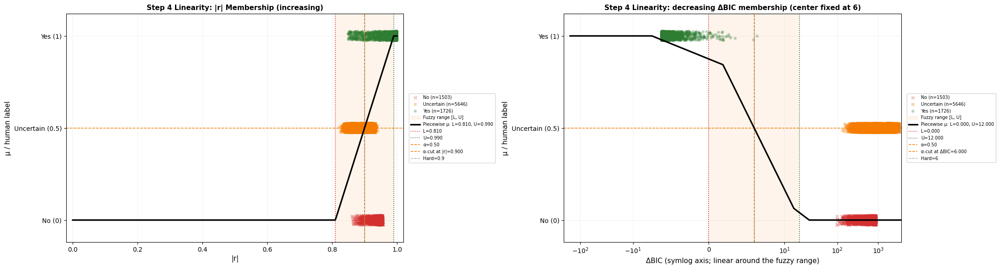

Step 4 α-cuts:
  |r|:  α=0.50 → |r| ≥ 0.900
  ΔBIC: α=0.50 → ΔBIC ≤ 6.00 (fixed at 6)
  Combined: μ_line = min(μ_r, μ_bic) ≥ 0.50


In [957]:
# ── Figure B — Step 4 fuzzy calibration (each replicate is one point) ──
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 6))

# |r| gate (increasing)
step4_alpha_r = plot_calibrated_gate(
    ax1, rep_s4['abs_r'].values, rep_s4['label_s4'].values,
    best_R_L, best_R_U, '|r|',
    'Step 4 Linearity: |r| Membership (increasing)',
    alpha=ALPHA, hard_threshold=0.9, increasing=True,
)

# ΔBIC line-membership gate (decreasing), centered exactly at 6
step4_alpha_bic = plot_calibrated_gate(
    ax2, rep_s4['delta_bic'].values, rep_s4['label_s4'].values,
    DELTA_BIC_L, DELTA_BIC_U, 'ΔBIC',
    'Step 4 Linearity: decreasing ΔBIC membership (center fixed at 6)',
    alpha=ALPHA, hard_threshold=DELTA_BIC_CENTER, increasing=False,
)
ax2.set_xscale('symlog', linthresh=DELTA_BIC_U, linscale=2.0)
ax2.set_xlabel('ΔBIC (symlog axis; linear around the fuzzy range)', fontsize=11)

plt.tight_layout()
plt.savefig(OUT_DIR / 'step4_figure_B_fuzzy.png', dpi=150, bbox_inches='tight')
plt.show()

print(f'Step 4 α-cuts:')
print(f'  |r|:  α={ALPHA:.2f} → |r| ≥ {step4_alpha_r:.3f}')
print(f'  ΔBIC: α={ALPHA:.2f} → ΔBIC ≤ {step4_alpha_bic:.2f} (fixed at 6)')
print(f'  Combined: μ_line = min(μ_r, μ_bic) ≥ {ALPHA:.2f}')

In [958]:
# ── Step 4 Per-replicate μ_line + Summary ──

# ── Compute μ for every replicate that entered Step 4 ──
s4_reps = strong[strong['label_s4'].notna() & strong['delta_bic'].notna()].copy()
s4_reps['mu_r'] = s4_reps['abs_r'].apply(lambda v: fuzzy_mu(v, best_R_L, best_R_U))
s4_reps['mu_bic'] = s4_reps['delta_bic'].apply(
    lambda v: 1.0 - fuzzy_mu(v, DELTA_BIC_L, DELTA_BIC_U))
s4_reps['mu_line'] = np.minimum(s4_reps['mu_r'], s4_reps['mu_bic'])
s4_reps['is_line'] = s4_reps['mu_line'] >= ALPHA

print(f'Step 4 per-replicate results:')
print(f'  Total: {len(s4_reps)}')
print(f'  Line (μ_line ≥ {ALPHA}): {s4_reps["is_line"].sum()}')
print(f'  Non-line: {(~s4_reps["is_line"]).sum()}')

# ── Summary per (family, SNR): mean μ and pass rate ──
summary_s4 = s4_reps.groupby(['family_id', 'snr_float']).agg(
    n_reps=('mu_line', 'count'),
    mu_r_mean=('mu_r', 'mean'),
    mu_bic_mean=('mu_bic', 'mean'),
    mu_line_mean=('mu_line', 'mean'),
    pass_rate=('is_line', 'mean'),
).reset_index()

print(f'\nPer (family, SNR) summary:')
display(summary_s4.round(3))

# Family × SNR summaries above are diagnostic tables only; they never route cases.

# ── Per-replicate branches ──
# Line is a terminal result; Non-line replicates enter Step 5 curvature analysis.
step4_line_case_ids = set(s4_reps.loc[s4_reps['is_line'], 'case_id'])
step4_nonlinear_case_ids = set(s4_reps.loc[~s4_reps['is_line'], 'case_id'])
step5_fids = sorted(s4_reps.loc[~s4_reps['is_line'], 'family_id'].unique())

print(f'\nStep 4 branches (replicate level):')
print(f'  Line terminal: {len(step4_line_case_ids)} cases')
print(f'  Non-line → Step 5: {len(step4_nonlinear_case_ids)} cases')
print(f'  Families represented in Step 5: {step5_fids}')

Step 4 per-replicate results:
  Total: 8875
  Line (μ_line ≥ 0.5): 1574
  Non-line: 7301

Per (family, SNR) summary:


,family_id,snr_float,n_reps,mu_r_mean,mu_bic_mean,mu_line_mean,pass_rate
0,F01,2.242,2,0.231,1.000,0.231,0.0
1,F01,2.395,1,0.238,1.000,0.238,0.0
2,F01,2.558,7,0.257,1.000,0.257,0.0
3,F01,2.733,7,0.309,0.993,0.309,0.0
4,F01,2.919,9,0.275,0.999,0.275,0.0
...,...,...,...,...,...,...,...
936,F14,1000.000,10,0.791,0.000,0.000,0.0
937,F14,2000.000,10,0.789,0.000,0.000,0.0
938,F14,5000.000,10,0.792,0.000,0.000,0.0
939,F14,10000.000,10,0.793,0.000,0.000,0.0



Step 4 branches (replicate level):
  Line terminal: 1574 cases
  Non-line → Step 5: 7301 cases
  Families represented in Step 5: ['F01', 'F02', 'F03', 'F04', 'F05', 'F06', 'F09', 'F10', 'F11', 'F12', 'F13', 'F14']


---

## Step 5 — Curvature Type: Fuzzy $f''$ Dominance

**前置条件**: Step 4 (Linearity) No 分支 — 不是直线，但通过了 Step 3 (强单调)。

沿用原 polyfit 的核心指标 $D=\texttt{f2_dominance}$。先对标准化后的 cubic fit 提取：

- `curvature_strength`: 曲率相对于 slope 的强度，用于拦截 Step 4 漏下来的近似直线；
- `f2_dominance` $D$: 正、负二阶导数中占主导一侧的 $|f''|$ 比例，范围 $[0.5,1]$；
- `f2_dom_sign`: 主导曲率的符号，只在 $D\ge U_D$ 时区分 Convex/Concave。

$L_D<D<U_D$ 是明确保留的 fuzzy/uncertain zone：$D\le L_D$ 判 Inflected；$D\ge U_D$ 再按主导符号判 Convex/Concave；中间不强制分类。连续 membership 在整个区间内保留。

> 当前 $L_D,U_D$ 由已人工确认的 family 类型拟合；之后若补充 family × SNR 的 curve-type `Uncertain` 标注，fuzzy zone 会随人工边界重新校正。

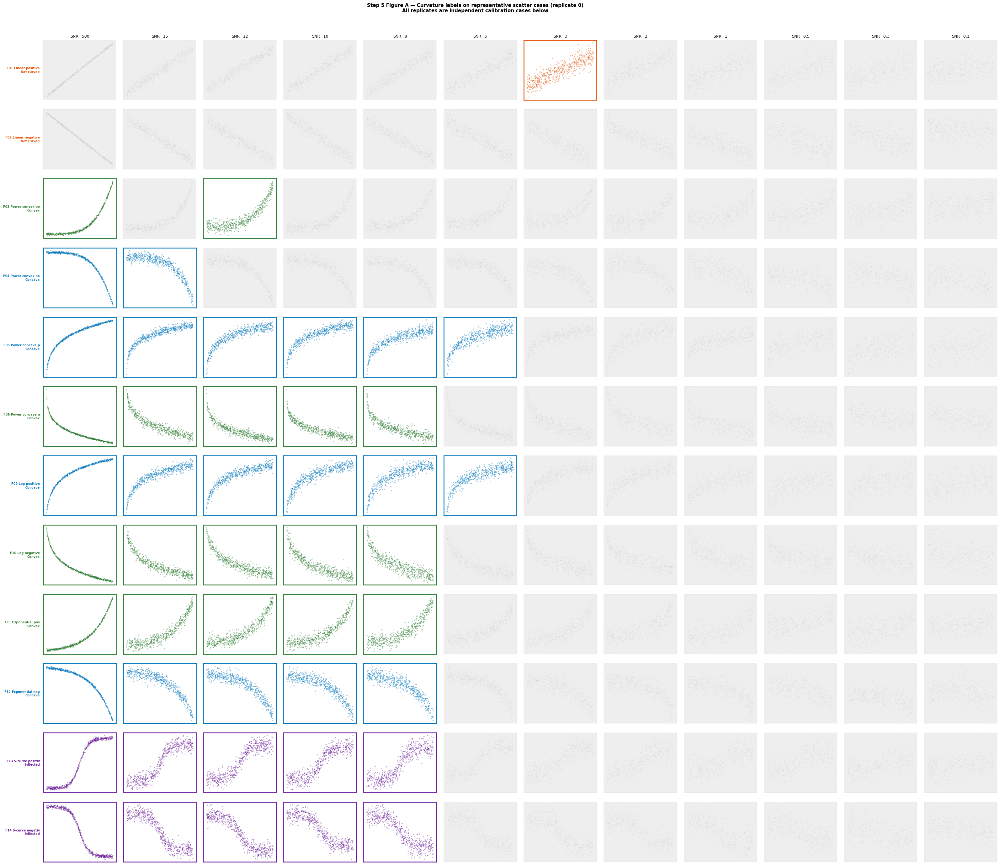

Computing Step 5 derivative evidence...
Step 5 derivative features: 7301 / 7301 cases
Families: ['F01', 'F02', 'F03', 'F04', 'F05', 'F06', 'F09', 'F10', 'F11', 'F12', 'F13', 'F14']


,curvature_strength,f2_dominance,q_pos,q_neg
family_id,,,,
F01,0.107,0.762,0.481,0.519
F02,0.112,0.748,0.496,0.504
F03,1.273,0.972,0.972,0.028
F04,1.277,0.972,0.028,0.972
F05,1.096,0.846,0.154,0.846
F06,1.090,0.846,0.846,0.154
F09,1.084,0.865,0.135,0.865
F10,1.087,0.864,0.864,0.136
F11,0.947,0.980,0.980,0.020


In [959]:
# ── Step 5: cubic derivative evidence for every non-line replicate ──
# x/y are standardized so curvature strength is comparable across families.
INTERIOR_MARGIN_S5 = 0.10
N_GRID_S5 = 200

# Human-confirmed curvature class of the synthetic family.
# Direction matters: negating a function reverses convex ↔ concave.
CURVATURE_FAMILY_CLASS = {
    'F03': 'Convex',   'F04': 'Concave',
    'F05': 'Concave',  'F06': 'Convex',
    'F09': 'Concave',  'F10': 'Convex',
    'F11': 'Convex',   'F12': 'Concave',
    'F13': 'Inflected','F14': 'Inflected',
}

# ── Figure A — representative scatter grid with Step 5 human labels ──
# The grid shows replicate 0 for readability; calibration/routing below uses every replicate separately.
show_fids_s5 = sorted(set(step5_fids))
class_color_s5 = {
    'Convex': '#2e7d32', 'Concave': '#0277BD',
    'Inflected': '#6A1B9A', 'Not curved': '#E65100',
}
fig, axes = plt.subplots(len(show_fids_s5), len(actual_snrs),
                         figsize=(2.8 * len(actual_snrs), 2.3 * len(show_fids_s5)))
if len(show_fids_s5) == 1:
    axes = axes[np.newaxis, :]
for ri, fid in enumerate(show_fids_s5):
    expected = CURVATURE_FAMILY_CLASS.get(fid, 'Not curved')
    color = class_color_s5[expected]
    fam_cases = all_cases[(all_cases['family_id'] == fid) & (all_cases['replicate'] == 0)]
    for ci, snr_val in enumerate(actual_snrs):
        ax = axes[ri, ci]
        match = fam_cases[fam_cases['snr_float'] == snr_val]
        enters = len(match) > 0 and match.iloc[0]['case_id'] in step4_nonlinear_case_ids
        if len(match) > 0:
            idx = case_idx_map[match.iloc[0]['case_id']]
            ax.scatter(x_all[idx], y_all[idx], s=6,
                       alpha=0.45 if enters else 0.15,
                       color=color if enters else '#bdbdbd',
                       edgecolors='none', rasterized=True)
        ax.set_xticks([]); ax.set_yticks([])
        ax.set_facecolor('#ffffff' if enters else '#eeeeee')
        for sp in ax.spines.values():
            sp.set_linewidth(2.0 if enters else 0.3)
            sp.set_color(color if enters else '#d0d0d0')
        if ri == 0:
            label = 'SNR=∞' if np.isinf(snr_levels[ci]) else (
                f'SNR={int(snr_levels[ci])}' if snr_levels[ci] >= 1 else f'SNR={snr_levels[ci]}')
            ax.set_title(label, fontsize=9)
        if ci == 0:
            ax.set_ylabel(f'{fid} {SHORT.get(fid, "")[:15]}\n{expected}',
                          fontsize=7, fontweight='bold', rotation=0,
                          ha='right', va='center', labelpad=8, color=color)
fig.suptitle('Step 5 Figure A — Curvature labels on representative scatter cases (replicate 0)\n'
             'All replicates are independent calibration cases below',
             fontsize=11, fontweight='bold', y=0.998)
plt.subplots_adjust(left=0.09, right=0.995, top=0.955, bottom=0.005,
                    hspace=0.16, wspace=0.10)
plt.savefig(OUT_DIR / 'step5_figure_A_labels.png', dpi=150, bbox_inches='tight')
plt.show()

def curvature_evidence(x, y):
    order = np.argsort(x)
    xs = np.asarray(x, dtype=float)[order]
    ys = np.asarray(y, dtype=float)[order]
    xn = (xs - xs.mean()) / max(xs.std(), 1e-10)
    yn = (ys - ys.mean()) / max(ys.std(), 1e-10)

    coeffs = np.polyfit(xn, yn, 3)
    p = np.poly1d(coeffs)
    x_lo = xn.min() + INTERIOR_MARGIN_S5 * (xn.max() - xn.min())
    x_hi = xn.max() - INTERIOR_MARGIN_S5 * (xn.max() - xn.min())
    grid = np.linspace(x_lo, x_hi, N_GRID_S5)
    f1 = np.polyder(p, 1)(grid)
    f2 = np.polyder(p, 2)(grid)

    pos_mass = np.abs(f2[f2 > 0]).sum()
    neg_mass = np.abs(f2[f2 < 0]).sum()
    total_mass = pos_mass + neg_mass
    if total_mass < 1e-12:
        q_pos = q_neg = 0.5
    else:
        q_pos = pos_mass / total_mass
        q_neg = neg_mass / total_mass

    # 0: essentially linear; larger: clearer curvature relative to slope.
    curvature_strength = np.mean(np.abs(f2)) / (np.mean(np.abs(f1)) + 1e-12)
    f2_dominance = max(q_pos, q_neg)
    f2_dom_sign = 1 if q_pos >= q_neg else -1

    pred = p(xn)
    ss_tot = np.sum((yn - yn.mean()) ** 2)
    r2_cubic = 1.0 - np.sum((yn - pred) ** 2) / ss_tot if ss_tot > 1e-30 else 0.0
    return {
        'curvature_strength': curvature_strength,
        'f2_dominance': f2_dominance, 'f2_dom_sign': f2_dom_sign,
        'q_pos': q_pos, 'q_neg': q_neg, 'r2_cubic_s5': r2_cubic,
    }

print('Computing Step 5 derivative evidence...')
feature_rows_s5 = []
for _, row in strong[strong['case_id'].isin(step4_nonlinear_case_ids)].iterrows():
    cid = row['case_id']
    if cid not in case_idx_map:
        continue
    idx = case_idx_map[cid]
    feat = curvature_evidence(x_all[idx], y_all[idx])
    feat['case_id'] = cid
    feature_rows_s5.append(feat)

features_s5 = pd.DataFrame(feature_rows_s5)
step5_reps = strong[strong['case_id'].isin(step4_nonlinear_case_ids)].merge(
    features_s5, on='case_id', how='inner'
)
step5_reps['expected_curvature'] = step5_reps['family_id'].map(CURVATURE_FAMILY_CLASS)
step5_reps['label_curved'] = step5_reps['expected_curvature'].notna().astype(float)
# 1 = constant-sign curvature (Convex/Concave); 0 = Inflected; line leakage is excluded.
step5_reps['label_constant_curvature'] = np.where(
    step5_reps['expected_curvature'].isin(['Convex', 'Concave']), 1.0,
    np.where(step5_reps['expected_curvature'].eq('Inflected'), 0.0, np.nan),
)

print(f'Step 5 derivative features: {len(step5_reps)} / {len(step4_nonlinear_case_ids)} cases')
print('Families:', sorted(step5_reps['family_id'].unique()))
display(step5_reps.groupby('family_id')[[
    'curvature_strength', 'f2_dominance', 'q_pos', 'q_neg'
]].mean().round(3))

In [960]:
# ── Step 5: fit curvature-strength gate and one fuzzy f2-dominance range ──
def fit_fuzzy_1d(values, labels, n_grid=81):
    values = np.asarray(values, dtype=float)
    labels = np.asarray(labels, dtype=float)
    keep = np.isfinite(values) & np.isfinite(labels)
    values, labels = values[keep], labels[keep]
    lo, hi = np.quantile(values, [0.01, 0.99])
    if hi <= lo + 1e-12:
        hi = lo + 1e-6
    grid = np.linspace(lo, hi, n_grid)
    best = (np.inf, grid[0], grid[-1])
    for i, L_c in enumerate(grid[:-1]):
        for U_c in grid[i + 1:]:
            m = mse_fuzzy(L_c, U_c, values, labels)
            if m < best[0]:
                best = (m, L_c, U_c)
    return {'mse': float(best[0]), 'L': float(best[1]), 'U': float(best[2])}

valid_d_s5 = step5_reps['label_constant_curvature'].notna()
step5_fit = {
    'curved': fit_fuzzy_1d(
        step5_reps['curvature_strength'], step5_reps['label_curved']),
    'f2_dominance': fit_fuzzy_1d(
        step5_reps.loc[valid_d_s5, 'f2_dominance'],
        step5_reps.loc[valid_d_s5, 'label_constant_curvature']),
}

for name, fit in step5_fit.items():
    print(f'{name:10s}: L={fit["L"]:.3f} U={fit["U"]:.3f} MSE={fit["mse"]:.4f}')

C_L = step5_fit['curved']['L']
C_U = step5_fit['curved']['U']
D_L = step5_fit['f2_dominance']['L']
D_U = step5_fit['f2_dominance']['U']

step5_reps['mu_curved'] = step5_reps['curvature_strength'].apply(
    lambda v: fuzzy_mu(v, C_L, C_U))
# μ_constant: 0 at/below D_L, 1 at/above D_U, linear inside the fuzzy zone.
step5_reps['mu_constant_curvature'] = step5_reps['f2_dominance'].apply(
    lambda v: fuzzy_mu(v, D_L, D_U))
step5_reps['mu_inflected'] = 1.0 - step5_reps['mu_constant_curvature']

def route_curvature(row):
    # Curvature-strength fuzzy zone is also retained as uncertain.
    if row['curvature_strength'] < C_U:
        return 'Curvature uncertain'
    D = row['f2_dominance']
    if D <= D_L:
        return 'Inflected'
    if D < D_U:
        return 'Curvature uncertain'
    return 'Convex' if row['f2_dom_sign'] > 0 else 'Concave'

def curvature_uncertain_reason(row):
    if row['curvature_strength'] < C_L:
        return 'weak-curvature / possible-line-leakage'
    if row['curvature_strength'] < C_U:
        return 'curvature-strength-fuzzy-zone'
    if D_L < row['f2_dominance'] < D_U:
        return 'f2-dominance-fuzzy-zone'
    return ''

step5_reps['curvature_fuzzy'] = step5_reps.apply(route_curvature, axis=1)
step5_reps['curvature_uncertain_reason'] = step5_reps.apply(curvature_uncertain_reason, axis=1)
step5_reps['expected_display'] = step5_reps['expected_curvature'].fillna('Not curved')

print(f'\nD fuzzy range: L_D={D_L:.3f}, U_D={D_U:.3f}')
print('  D ≤ L_D       → Inflected')
print('  L_D < D < U_D → Curvature uncertain (fuzzy zone)')
print('  D ≥ U_D       → Convex/Concave by f2_dom_sign')
print('\nStep 5 replicate-level fuzzy results:')
print(step5_reps['curvature_fuzzy'].value_counts().to_string())
print('\nExpected family class × fuzzy result:')
display(pd.crosstab(step5_reps['expected_display'], step5_reps['curvature_fuzzy']))

curved    : L=0.358 U=0.377 MSE=0.0000
f2_dominance: L=0.550 U=0.556 MSE=0.0000

D fuzzy range: L_D=0.550, U_D=0.556
  D ≤ L_D       → Inflected
  L_D < D < U_D → Curvature uncertain (fuzzy zone)
  D ≥ U_D       → Convex/Concave by f2_dom_sign

Step 5 replicate-level fuzzy results:
curvature_fuzzy
Concave                2829
Convex                 2817
Inflected              1503
Curvature uncertain     152

Expected family class × fuzzy result:


curvature_fuzzy,Concave,Convex,Curvature uncertain,Inflected
expected_display,,,,
Concave,2829,0,0,0
Convex,0,2817,0,0
Inflected,0,0,0,1503
Not curved,0,0,152,0


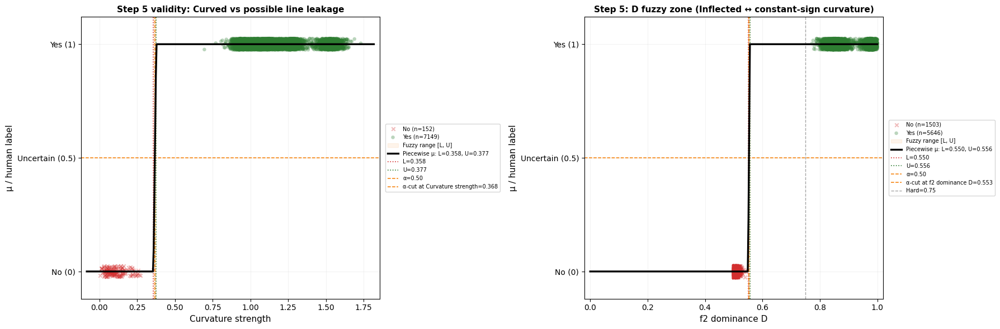

Step 5 mean memberships and uncertain rate by family:


,n,mu_curved,D,mu_constant,mu_inflected,uncertain_rate
family_id,,,,,,
F01,79,0.0,0.762,0.83,0.17,1.0
F02,73,0.0,0.748,0.89,0.11,1.0
F03,564,1.0,0.972,1.00,0.00,0.0
F04,562,1.0,0.972,1.00,0.00,0.0
F05,774,1.0,0.846,1.00,0.00,0.0
F06,764,1.0,0.846,1.00,0.00,0.0
F09,764,1.0,0.865,1.00,0.00,0.0
F10,762,1.0,0.864,1.00,0.00,0.0
F11,727,1.0,0.980,1.00,0.00,0.0


In [961]:
# ── Step 5 calibrated strength gate + the explicit [D_L, D_U] fuzzy zone ──
fig, axes = plt.subplots(1, 2, figsize=(18, 6))
plot_specs_s5 = [
    ('curved', 'curvature_strength', 'label_curved', 'Curvature strength',
     'Step 5 validity: Curved vs possible line leakage', None),
    ('f2_dominance', 'f2_dominance', 'label_constant_curvature', 'f2 dominance D',
     'Step 5: D fuzzy zone (Inflected ↔ constant-sign curvature)', 0.75),
]
for ax, (name, value_col, label_col, xlab, title, hard) in zip(axes.flat, plot_specs_s5):
    fit = step5_fit[name]
    plot_calibrated_gate(
        ax, step5_reps[value_col], step5_reps[label_col],
        fit['L'], fit['U'], xlab, title,
        alpha=ALPHA, hard_threshold=hard, increasing=True,
    )
plt.tight_layout()
plt.savefig(OUT_DIR / 'step5_figure_B_fuzzy.png', dpi=150, bbox_inches='tight')
plt.show()

summary_s5 = step5_reps.groupby(['family_id', 'snr_float']).agg(
    n_reps=('case_id', 'size'),
    mu_curved_mean=('mu_curved', 'mean'),
    D_mean=('f2_dominance', 'mean'),
    mu_constant_mean=('mu_constant_curvature', 'mean'),
    mu_inflected_mean=('mu_inflected', 'mean'),
    uncertain_rate=('curvature_fuzzy', lambda s: np.mean(s == 'Curvature uncertain')),
).reset_index()

family_s5 = step5_reps.groupby('family_id').agg(
    n=('case_id', 'size'),
    mu_curved=('mu_curved', 'mean'),
    D=('f2_dominance', 'mean'),
    mu_constant=('mu_constant_curvature', 'mean'),
    mu_inflected=('mu_inflected', 'mean'),
    uncertain_rate=('curvature_fuzzy', lambda s: np.mean(s == 'Curvature uncertain')),
)
print('Step 5 mean memberships and uncertain rate by family:')
display(family_s5.round(3))

---

## All Steps — Fitted Fuzzy Curves Summary

Overlay all fuzzy curves and save all parameters.

In [962]:
# ── Save all parameters ──
import json as json_mod

fuzzy_params = {
    'alpha': ALPHA,
    'step1_mic': {
        'L': float(MIC_L), 'U': float(MIC_U),
        'hard_threshold': 0.8,
        'mse': float(best_mse),
    },
    'step2_rho': {
        'L': float(best_L_rho), 'U': float(best_U_rho),
        'hard_threshold': 0.7,
        'mse': float(best_mse_rho),
    },
    'step2_r': {
        'L': float(best_L_r), 'U': float(best_U_r),
        'hard_threshold': 0.7,
        'mse': float(best_mse_r),
    },
    'step3_rho': {
        'L': float(best_L_s3), 'U': float(best_U_s3),
        'hard_threshold': 0.9,
        'mse': float(best_mse_s3),
    },
    'step4_r': {
        'L': float(best_R_L), 'U': float(best_R_U),
        'mse': float(best_mse_r_s4),
        'increasing': True,
    },
    'step4_delta_bic': {
        'L': float(DELTA_BIC_L), 'center': float(DELTA_BIC_CENTER), 'U': float(DELTA_BIC_U),
        'mse': float(mse_bic),
        'definition': 'BIC_linear - min(BIC_quadratic, BIC_cubic)',
        'increasing': False,
        'combined_mse': float(combined_mse),
    },
    'step5_curvature': {
        'curvature_strength': {
            'L': float(C_L), 'U': float(C_U),
            'mse': float(step5_fit['curved']['mse']), 'increasing': True,
        },
        'f2_dominance': {
            'L_D': float(D_L), 'U_D': float(D_U),
            'mse': float(step5_fit['f2_dominance']['mse']),
            'definition': 'max(weighted positive |f2| fraction, weighted negative |f2| fraction)',
            'routing': 'D<=L_D: Inflected; L_D<D<U_D: Curvature uncertain; D>=U_D: sign -> Convex/Concave',
        },
    },
    'family_groups': {
        'simple': SIMPLE_FAMILIES,
        'uncertain': UNCERTAIN_FAMILIES,
        'complex': COMPLEX_FAMILIES,
        'no_global': NO_GLOBAL,
        'strong_mono': STRONG_MONO_FAM,
        'uncertain_mono': UNCERTAIN_MONO,
        'weak_mono': WEAK_MONO_FAM,
        'linear': LINEAR_FAM,
        'curvature_class': CURVATURE_FAMILY_CLASS,
    },
    'annotations': {
        'step1': {'CLEAR_SNR': CLEAR_SNR, 'THRESHOLD_SNR': THRESHOLD_SNR},
        'step2': {'CLEAR_SNR': CLEAR_SNR_S2, 'THRESHOLD_SNR': THRESHOLD_SNR_S2},
        'step3': {'CLEAR_SNR': CLEAR_SNR_S3, 'THRESHOLD_SNR': THRESHOLD_SNR_S3},
        'step4': {'CLEAR_SNR': CLEAR_SNR_S4, 'THRESHOLD_SNR': THRESHOLD_SNR_S4},
        'step5': {'family_class': CURVATURE_FAMILY_CLASS},
    },
}

out_file = OUT_DIR / 'fuzzy_params.json'
with open(out_file, 'w') as f:
    json_mod.dump(fuzzy_params, f, indent=2)

print(f'Saved to {out_file}')
print()
print('=' * 60)
print('Fuzzy Calibration Summary')
print('=' * 60)
for name, L, U, hard in [
    ('Step 1 MIC',  MIC_L,      MIC_U,      0.8),
    ('Step 2 |ρ|',  best_L_rho, best_U_rho, 0.7),
    ('Step 2 |r|',  best_L_r,   best_U_r,   0.7),
    ('Step 3 |ρ|',  best_L_s3,  best_U_s3,  0.9),
    ('Step 4 |r|',  best_R_L,   best_R_U,   0.9),
]:
    print(f'  {name:12s}  L={L:.3f}  U={U:.3f}  (hard={hard})')
print(f'  {"Step 4 ΔBIC":12s}  L={DELTA_BIC_L:.1f}  center={DELTA_BIC_CENTER:.1f}  U={DELTA_BIC_U:.1f}  (decreasing)')
print(f'  Combined MSE = {combined_mse:.4f}')
print(f'  Step 5 strength    L={C_L:.3f}  U={C_U:.3f}  MSE={step5_fit["curved"]["mse"]:.4f}')
print(f'  Step 5 dominance   L_D={D_L:.3f}  U_D={D_U:.3f}  MSE={step5_fit["f2_dominance"]["mse"]:.4f}')
print('=' * 60)
print()
print('Family 分组:')
print(f'  Simple: {SIMPLE_FAMILIES}')
print(f'  Uncertain: {UNCERTAIN_FAMILIES}')
print(f'  Complex: {COMPLEX_FAMILIES}')
print(f'  No-global: {NO_GLOBAL}')
print(f'  Strong mono: {STRONG_MONO_FAM}')
print(f'  Linear: {LINEAR_FAM}')
print()
print('Replicate-level cascading filter:')
print(f'  Step 1 Global pass: {int(strong["pass_s1"].sum())} cases')
print(f'  Step 2 Simple pass: {int(strong["pass_s2"].sum())} cases')
print(f'  Step 3 Monotonic pass: {int(strong["pass_s3"].sum())} cases')
print(f'  Step 4 Line terminal: {len(step4_line_case_ids)} cases')
print(f'  Step 4 Non-line → Step 5: {len(step4_nonlinear_case_ids)} cases')
print(f'  Step 5 classified curvature: {(step5_reps["curvature_fuzzy"] != "Curvature uncertain").sum()} cases')
print(f'  Step 5 curvature uncertain: {(step5_reps["curvature_fuzzy"] == "Curvature uncertain").sum()} cases')
print()
print('决策树: Step 1 (MIC) → Step 2 (Simple?) → Step 3 (Strong Mono?) → Step 4 (Linear? |r|+ΔBIC, center=6) → Step 5 (Convex/Concave/Inflected/Curvature uncertain)')

# ══════════════════════════════════════════════════════
# Per-step conditional success tables
# denominator = cases correctly delivered by the previous step
# ══════════════════════════════════════════════════════
eval_cases = strong[['case_id', 'family_id']].copy()
eval_cases['original_count_flag'] = 1

# Expected route under the current tree design.
expected_s1_yes_fids = set(FAMILIES) - set(NO_GLOBAL)
expected_s2_yes_fids = set(SIMPLE_FAMILIES + UNCERTAIN_FAMILIES)
expected_s3_yes_fids = set(STRONG_MONO_FAM + UNCERTAIN_MONO)
expected_s4_line_fids = set(LINEAR_FAM)
expected_s4_nonline_fids = set(CURVATURE_FAMILY_CLASS)

eval_cases['expected_s1_yes'] = eval_cases['family_id'].isin(expected_s1_yes_fids)
eval_cases['correct_s1'] = strong['pass_s1'].to_numpy() == eval_cases['expected_s1_yes'].to_numpy()
eval_cases['enter_s1'] = True

# Step 2 only receives families whose correct Step 1 category is Global relationship.
eval_cases['enter_s2'] = (
    eval_cases['correct_s1'] & eval_cases['expected_s1_yes'] & strong['pass_s1'].to_numpy()
)
eval_cases['expected_s2_yes'] = eval_cases['family_id'].isin(expected_s2_yes_fids)
eval_cases['correct_s2'] = eval_cases['enter_s2'] & (
    strong['pass_s2'].to_numpy() == eval_cases['expected_s2_yes'].to_numpy()
)

# Step 3 only receives cases correctly identified as Simple at Step 2.
eval_cases['enter_s3'] = (
    eval_cases['correct_s2'] & eval_cases['expected_s2_yes'] & strong['pass_s2'].to_numpy()
)
eval_cases['expected_s3_yes'] = eval_cases['family_id'].isin(expected_s3_yes_fids)
eval_cases['correct_s3'] = eval_cases['enter_s3'] & (
    strong['pass_s3'].to_numpy() == eval_cases['expected_s3_yes'].to_numpy()
)

# Step 4 only receives cases correctly identified as Strong monotonic at Step 3.
eval_cases['enter_s4'] = (
    eval_cases['correct_s3'] & eval_cases['expected_s3_yes'] & strong['pass_s3'].to_numpy()
)
eval_cases['pred_s4_line'] = eval_cases['case_id'].isin(step4_line_case_ids)
eval_cases['expected_s4_line'] = eval_cases['family_id'].isin(expected_s4_line_fids)
eval_cases['correct_s4'] = eval_cases['enter_s4'] & (
    eval_cases['pred_s4_line'] == eval_cases['expected_s4_line']
)

# Step 5 only receives cases correctly assigned to Non-line at Step 4.
step5_prediction_map_for_eval = step5_reps.set_index('case_id')['curvature_fuzzy']
eval_cases['enter_s5'] = (
    eval_cases['correct_s4']
    & eval_cases['family_id'].isin(expected_s4_nonline_fids)
    & ~eval_cases['pred_s4_line']
)
eval_cases['pred_s5'] = eval_cases['case_id'].map(step5_prediction_map_for_eval)
eval_cases['expected_s5'] = eval_cases['family_id'].map(CURVATURE_FAMILY_CLASS)
eval_cases['correct_s5'] = eval_cases['enter_s5'] & (
    eval_cases['pred_s5'] == eval_cases['expected_s5']
)

STEP_EXPECTED_CATEGORY = {
    1: {fid: ('Global relationship' if fid in expected_s1_yes_fids else 'No global relationship')
        for fid in ALL_FIDS},
    2: {fid: ('Simple' if fid in expected_s2_yes_fids else 'Complex')
        for fid in expected_s1_yes_fids},
    3: {fid: ('Strong monotonic' if fid in expected_s3_yes_fids else 'Not strong monotonic')
        for fid in expected_s2_yes_fids},
    4: {fid: ('Line' if fid in expected_s4_line_fids else 'Non-line')
        for fid in expected_s3_yes_fids},
    5: CURVATURE_FAMILY_CLASS,
}
STEP_FAMILIES = {
    1: list(ALL_FIDS),
    2: sorted(expected_s1_yes_fids),
    3: sorted(expected_s2_yes_fids),
    4: sorted(expected_s3_yes_fids),
    5: sorted(expected_s4_nonline_fids),
}

def make_step_success_table(step):
    enter_col = f'enter_s{step}'
    correct_col = f'correct_s{step}'
    relevant = eval_cases[eval_cases['family_id'].isin(STEP_FAMILIES[step])].copy()
    original_counts = strong.groupby('family_id')['case_id'].size()
    table = relevant.groupby('family_id').agg(
        previous_step_assigned_count=(enter_col, 'sum'),
        current_step_correct_count=(correct_col, 'sum'),
    ).reset_index()
    table.insert(1, 'original_count', table['family_id'].map(original_counts).astype(int))
    table['step_success_rate'] = np.where(
        table['previous_step_assigned_count'] > 0,
        table['current_step_correct_count'] / table['previous_step_assigned_count'],
        np.nan,
    )
    table['expected_category'] = table['family_id'].map(STEP_EXPECTED_CATEGORY[step])
    table['family_name'] = table['family_id'].map(SHORT)
    table = table[[
        'family_id', 'original_count', 'previous_step_assigned_count',
        'current_step_correct_count', 'step_success_rate',
        'expected_category', 'family_name',
    ]].sort_values('family_id')
    return table

step_success_tables = {}
for step in range(1, 6):
    table = make_step_success_table(step)
    step_success_tables[step] = table
    table_path = OUT_DIR / f'step{step}_family_success.csv'
    table.to_csv(table_path, index=False)
    print(f'\nStep {step} conditional success by family')
    print('rate = current_step_correct_count / previous_step_assigned_count')
    table_display = table.copy()
    table_display['step_success_rate'] = table_display['step_success_rate'].map(
        lambda v: f'{v:.1%}' if pd.notna(v) else 'N/A')
    display(table_display.set_index('family_id'))
    print(f'Saved: {table_path}')

# ══════════════════════════════════════════════════════
# Final table — success rate by original family
# ══════════════════════════════════════════════════════
# Build one terminal prediction for every replicate by following its actual path.
final_eval = strong[['case_id', 'family_id', 'snr_float']].copy()
final_eval['final_prediction'] = 'Unresolved'
final_eval.loc[~strong['pass_s1'].values, 'final_prediction'] = 'No global relationship'
final_eval.loc[(strong['pass_s1'] & ~strong['pass_s2']).values, 'final_prediction'] = 'Complex / not simple'
final_eval.loc[(strong['pass_s2'] & ~strong['pass_s3']).values, 'final_prediction'] = 'Not strong monotonic'
final_eval.loc[final_eval['case_id'].isin(step4_line_case_ids), 'final_prediction'] = 'Line'
step5_prediction_map = step5_reps.set_index('case_id')['curvature_fuzzy']
final_eval.loc[final_eval['case_id'].isin(step5_prediction_map.index), 'final_prediction'] = (
    final_eval.loc[final_eval['case_id'].isin(step5_prediction_map.index), 'case_id']
    .map(step5_prediction_map)
)

# Expected terminal type under the current decision-tree design.
EXPECTED_FINAL_TYPE = {
    **{fid: 'No global relationship' for fid in NO_GLOBAL + ['Null']},
    **{fid: 'Complex / not simple' for fid in COMPLEX_FAMILIES},
    'F15': 'Not strong monotonic', 'F16': 'Not strong monotonic',
    **{fid: 'Line' for fid in LINEAR_FAM},
    **CURVATURE_FAMILY_CLASS,
}
final_eval['expected_final_type'] = final_eval['family_id'].map(EXPECTED_FINAL_TYPE)
final_eval['family_name'] = final_eval['family_id'].map(SHORT)
final_eval['correct'] = final_eval['final_prediction'].eq(final_eval['expected_final_type'])

def most_common_prediction(values):
    counts = values.value_counts()
    return counts.index[0] if len(counts) else ''

family_success_table = (
    final_eval.groupby(['family_id', 'family_name', 'expected_final_type'], dropna=False)
    .agg(
        original_count=('case_id', 'size'),
        correct_count=('correct', 'sum'),
        most_common_prediction=('final_prediction', most_common_prediction),
    )
    .reset_index()
)
family_success_table['success_rate'] = (
    family_success_table['correct_count'] / family_success_table['original_count']
)
family_success_table = family_success_table[[
    'family_id', 'original_count', 'correct_count', 'success_rate',
    'expected_final_type', 'most_common_prediction', 'family_name',
]].sort_values('family_id')

table_out = OUT_DIR / 'final_family_classification_success.csv'
family_success_table.to_csv(table_out, index=False)
print('\nFinal classification success by family')
print('(original_count and correct_count are replicate counts; uncertain is counted as incorrect)')
family_success_display = family_success_table.copy()
family_success_display['success_rate'] = family_success_display['success_rate'].map(
    lambda v: f'{v:.1%}' if pd.notna(v) else 'N/A')
display(family_success_display.set_index('family_id'))
print(f'Saved table to {table_out}')

Saved to output/S3_polyfit/fuzzy_params.json

Fuzzy Calibration Summary
  Step 1 MIC    L=0.160  U=0.840  (hard=0.8)
  Step 2 |ρ|    L=0.500  U=0.990  (hard=0.7)
  Step 2 |r|    L=0.470  U=0.990  (hard=0.7)
  Step 3 |ρ|    L=0.730  U=0.990  (hard=0.9)
  Step 4 |r|    L=0.810  U=0.990  (hard=0.9)
  Step 4 ΔBIC   L=0.0  center=6.0  U=12.0  (decreasing)
  Combined MSE = 0.1700
  Step 5 strength    L=0.358  U=0.377  MSE=0.0000
  Step 5 dominance   L_D=0.550  U_D=0.556  MSE=0.0000

Family 分组:
  Simple: ['F01', 'F02', 'F03', 'F04', 'F05', 'F06', 'F09', 'F10', 'F11', 'F12']
  Uncertain: ['F13', 'F14', 'F15', 'F16']
  Complex: ['F17', 'F18', 'F21', 'F22', 'F23', 'F24', 'F25', 'F26']
  No-global: ['F07', 'F08', 'F19', 'F20']
  Strong mono: ['F01', 'F02', 'F03', 'F04', 'F05', 'F06', 'F09', 'F10', 'F11', 'F12']
  Linear: ['F01', 'F02']

Replicate-level cascading filter:
  Step 1 Global pass: 19887 cases
  Step 2 Simple pass: 12730 cases
  Step 3 Monotonic pass: 8875 cases
  Step 4 Line terminal: 

,original_count,previous_step_assigned_count,current_step_correct_count,step_success_rate,expected_category,family_name
family_id,,,,,,
F01,2060,2060,1004,48.7%,Global relationship,Linear positive
F02,2060,2060,1003,48.7%,Global relationship,Linear negative
F03,2060,2060,908,44.1%,Global relationship,Power convex positive
F04,2060,2060,912,44.3%,Global relationship,Power convex negative
F05,2060,2060,916,44.5%,Global relationship,Power concave positive
F06,2060,2060,913,44.3%,Global relationship,Power concave negative
F07,2060,2060,1389,67.4%,No global relationship,Saturation positive
F08,2060,2060,1405,68.2%,No global relationship,Saturation negative
F09,2060,2060,917,44.5%,Global relationship,Log positive


Saved: output/S3_polyfit/step1_family_success.csv

Step 2 conditional success by family
rate = current_step_correct_count / previous_step_assigned_count


,original_count,previous_step_assigned_count,current_step_correct_count,step_success_rate,expected_category,family_name
family_id,,,,,,
F01,2060,1004,983,97.9%,Simple,Linear positive
F02,2060,1003,984,98.1%,Simple,Linear negative
F03,2060,908,816,89.9%,Simple,Power convex positive
F04,2060,912,814,89.3%,Simple,Power convex negative
F05,2060,916,911,99.5%,Simple,Power concave positive
F06,2060,913,903,98.9%,Simple,Power concave negative
F09,2060,917,905,98.7%,Simple,Log positive
F10,2060,923,907,98.3%,Simple,Log negative
F11,2060,928,897,96.7%,Simple,Exponential positive


Saved: output/S3_polyfit/step2_family_success.csv

Step 3 conditional success by family
rate = current_step_correct_count / previous_step_assigned_count


,original_count,previous_step_assigned_count,current_step_correct_count,step_success_rate,expected_category,family_name
family_id,,,,,,
F01,2060,983,866,88.1%,Strong monotonic,Linear positive
F02,2060,984,860,87.4%,Strong monotonic,Linear negative
F03,2060,816,564,69.1%,Strong monotonic,Power convex positive
F04,2060,814,562,69.0%,Strong monotonic,Power convex negative
F05,2060,911,774,85.0%,Strong monotonic,Power concave positive
F06,2060,903,764,84.6%,Strong monotonic,Power concave negative
F09,2060,905,764,84.4%,Strong monotonic,Log positive
F10,2060,907,762,84.0%,Strong monotonic,Log negative
F11,2060,897,727,81.0%,Strong monotonic,Exponential positive


Saved: output/S3_polyfit/step3_family_success.csv

Step 4 conditional success by family
rate = current_step_correct_count / previous_step_assigned_count


,original_count,previous_step_assigned_count,current_step_correct_count,step_success_rate,expected_category,family_name
family_id,,,,,,
F01,2060,866,787,90.9%,Line,Linear positive
F02,2060,860,787,91.5%,Line,Linear negative
F03,2060,564,564,100.0%,Non-line,Power convex positive
F04,2060,562,562,100.0%,Non-line,Power convex negative
F05,2060,774,774,100.0%,Non-line,Power concave positive
F06,2060,764,764,100.0%,Non-line,Power concave negative
F09,2060,764,764,100.0%,Non-line,Log positive
F10,2060,762,762,100.0%,Non-line,Log negative
F11,2060,727,727,100.0%,Non-line,Exponential positive


Saved: output/S3_polyfit/step4_family_success.csv

Step 5 conditional success by family
rate = current_step_correct_count / previous_step_assigned_count


,original_count,previous_step_assigned_count,current_step_correct_count,step_success_rate,expected_category,family_name
family_id,,,,,,
F03,2060,564,564,100.0%,Convex,Power convex positive
F04,2060,562,562,100.0%,Concave,Power convex negative
F05,2060,774,774,100.0%,Concave,Power concave positive
F06,2060,764,764,100.0%,Convex,Power concave negative
F09,2060,764,764,100.0%,Concave,Log positive
F10,2060,762,762,100.0%,Convex,Log negative
F11,2060,727,727,100.0%,Convex,Exponential positive
F12,2060,729,729,100.0%,Concave,Exponential negative
F13,2060,744,744,100.0%,Inflected,S-curve positive


Saved: output/S3_polyfit/step5_family_success.csv

Final classification success by family
(original_count and correct_count are replicate counts; uncertain is counted as incorrect)


,original_count,correct_count,success_rate,expected_final_type,most_common_prediction,family_name
family_id,,,,,,
F01,2060,787,38.2%,Line,No global relationship,Linear positive
F02,2060,787,38.2%,Line,No global relationship,Linear negative
F03,2060,564,27.4%,Convex,No global relationship,Power convex positive
F04,2060,562,27.3%,Concave,No global relationship,Power convex negative
F05,2060,774,37.6%,Concave,No global relationship,Power concave positive
F06,2060,764,37.1%,Convex,No global relationship,Power concave negative
F07,2060,1389,67.4%,No global relationship,No global relationship,Saturation positive
F08,2060,1405,68.2%,No global relationship,No global relationship,Saturation negative
F09,2060,764,37.1%,Concave,No global relationship,Log positive


Saved table to output/S3_polyfit/final_family_classification_success.csv
